In [1]:
import tensorflow as tf
tf.__version__
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 13956508720153092629,
 name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 6471431956986862116
 physical_device_desc: "device: XLA_CPU device",
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 6918604064
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 3286091841115450091
 physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2080 SUPER, pci bus id: 0000:01:00.0, compute capability: 7.5",
 name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 13523690672393857900
 physical_device_desc: "device: XLA_GPU device"]

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [3]:
tf.debugging.set_log_device_placement(True)

a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
c = tf.matmul(a, b)
print(c)

Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32)


In [4]:
import keras
from keras.models import Sequential, Model
from keras import layers, applications, optimizers
from keras.layers import Conv2D, MaxPool2D, AveragePooling2D, Dropout, Flatten, Dense, Activation, GlobalAveragePooling2D, GlobalMaxPooling2D, Input, concatenate
from keras.preprocessing.image import ImageDataGenerator, load_img

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import random

In [5]:
epochs = 100
batch_size = 5
image_size = 224

In [6]:
#load train data(25000 imgs each)

filenames = os.listdir('./input/train/train')
data = []
categories = []

for filename in filenames:
    category = filename.split('.')[0]
    if category == 'dog':
        categories.append(1)
    else:
        categories.append(0)
    
    image = keras.preprocessing.image.load_img(os.path.join('./input/train/train', filename),
                                               color_mode='rgb',
                                               target_size= (image_size,image_size))
    image = np.array(image)
    data.append(image)

data = np.array(data)
categories = np.array(categories)

print(data)
print(categories)

[[[[203 164  87]
   [206 167  90]
   [209 170  93]
   ...
   [245 203 119]
   [241 202 123]
   [239 200 121]]

  [[203 164  87]
   [206 167  90]
   [209 170  93]
   ...
   [245 205 120]
   [242 203 124]
   [240 201 122]]

  [[203 164  87]
   [206 167  90]
   [209 170  93]
   ...
   [245 204 122]
   [243 204 125]
   [241 202 123]]

  ...

  [[154 123  56]
   [155 124  57]
   [156 125  58]
   ...
   [  3   3   1]
   [  3   3   1]
   [  3   3   1]]

  [[153 122  55]
   [153 122  55]
   [154 123  56]
   ...
   [  2   2   0]
   [  2   2   0]
   [  2   2   0]]

  [[151 120  53]
   [152 121  54]
   [153 122  55]
   ...
   [  1   1   0]
   [  1   1   0]
   [  1   1   0]]]


 [[[ 39  44  40]
   [ 40  44  43]
   [ 41  45  46]
   ...
   [210 209 181]
   [207 204 171]
   [201 199 161]]

  [[ 40  45  41]
   [ 40  44  43]
   [ 41  45  46]
   ...
   [207 203 176]
   [203 200 169]
   [197 195 157]]

  [[ 39  44  40]
   [ 38  42  41]
   [ 37  41  42]
   ...
   [195 191 166]
   [198 193 164]
   [205 200

In [7]:
# shuffle dataset

idx = np.random.permutation(len(data))
data, categories = data[idx], categories[idx]

In [8]:
# split train 6(15,000) / val 2(5,000) / test 2(5,000)

x_train = data[:15000]
y_train = categories[:15000]
x_temp, y_temp = data[-10000:], categories[-10000:]

from sklearn.model_selection import train_test_split

x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5)

In [9]:
print(x_train, y_train)

print(x_temp, y_temp)
print(x_temp.shape, y_temp.shape)

print(x_val, y_val)

print(x_test, y_test)
print(x_test.shape, y_test.shape)

[[[[241 201 150]
   [241 201 150]
   [241 201 150]
   ...
   [224 175 117]
   [221 172 114]
   [218 171 115]]

  [[241 201 150]
   [241 201 150]
   [241 201 150]
   ...
   [224 175 117]
   [220 171 113]
   [222 175 119]]

  [[241 201 150]
   [241 201 150]
   [241 201 150]
   ...
   [224 175 117]
   [220 171 113]
   [220 173 117]]

  ...

  [[166 141 100]
   [165 140  99]
   [172 147 106]
   ...
   [138 114  78]
   [140 116  80]
   [136 112  78]]

  [[167 142 101]
   [167 142 101]
   [174 149 108]
   ...
   [137 113  77]
   [134 110  74]
   [134 110  76]]

  [[164 141 100]
   [165 142 101]
   [164 141 100]
   ...
   [138 114  80]
   [134 110  76]
   [133 109  73]]]


 [[[236 235 231]
   [248 253 247]
   [246 255 247]
   ...
   [255 255 250]
   [254 254 246]
   [170 166 157]]

  [[254 255 249]
   [254 255 248]
   [238 244 232]
   ...
   [255 255 250]
   [252 252 244]
   [133 131 119]]

  [[240 247 231]
   [209 213 196]
   [184 187 170]
   ...
   [179 181 170]
   [ 40  40  30]
   [189 190

In [10]:
def inception_module(x,
                     filters_1x1,
                     filters_3x3_reduce,
                     filters_3x3,
                     filters_5x5_reduce,
                     filters_5x5,
                     filters_pool_proj,
                     name=None):
    
    conv_1x1 = Conv2D(filters_1x1, (1, 1), padding='same', activation='relu',
                      kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    
    conv_3x3 = Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu',
                      kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    conv_3x3 = Conv2D(filters_3x3, (3, 3), padding='same', activation='relu',
                      kernel_initializer=kernel_init, bias_initializer=bias_init)(conv_3x3)

    conv_5x5 = Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu',
                      kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    conv_5x5 = Conv2D(filters_5x5, (5, 5), padding='same', activation='relu',
                      kernel_initializer=kernel_init, bias_initializer=bias_init)(conv_5x5)

    pool_proj = MaxPool2D((3, 3), strides=(1, 1), padding='same')(x)
    pool_proj = Conv2D(filters_pool_proj, (1, 1), padding='same', activation='relu',
                       kernel_initializer=kernel_init, bias_initializer=bias_init)(pool_proj)

    module = concatenate([conv_1x1, conv_3x3, conv_5x5, pool_proj], axis=3, name=name)
    
    return module

In [11]:
kernel_init = keras.initializers.glorot_uniform()
bias_init = keras.initializers.Constant(0.2)

In [12]:
input_layer = Input(shape=(image_size, image_size, 3))

x = Conv2D(64, (7, 7), padding='same', strides=(2, 2), activation='relu', name='conv_1_7x7/2',
           kernel_initializer=kernel_init, bias_initializer=bias_init)(input_layer)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_1_3x3/2')(x)
x = Conv2D(64, (1, 1), padding='same', strides=(1, 1), activation='relu', name='conv_2a_3x3/1')(x)
x = Conv2D(192, (3, 3), padding='same', strides=(1, 1), activation='relu', name='conv_2b_3x3/1')(x)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_2_3x3/2')(x)

x = inception_module(x, filters_1x1=64, filters_3x3_reduce=96, filters_3x3=128,
                     filters_5x5_reduce=16, filters_5x5=32, filters_pool_proj=32,
                     name='inception_3a')

x = inception_module(x, filters_1x1=128, filters_3x3_reduce=128, filters_3x3=192,
                     filters_5x5_reduce=32, filters_5x5=96, filters_pool_proj=64,
                     name='inception_3b')

x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_3_3x3/2')(x)

x = inception_module(x, filters_1x1=192, filters_3x3_reduce=96, filters_3x3=208,
                     filters_5x5_reduce=16, filters_5x5=48, filters_pool_proj=64,
                     name='inception_4a')


x1 = AveragePooling2D((5, 5), strides=3)(x)
x1 = Conv2D(128, (1, 1), padding='same', activation='relu')(x1)
x1 = Flatten()(x1)
x1 = Dense(1024, activation='relu')(x1)
x1 = Dropout(0.7)(x1)
x1 = Dense(2, activation='softmax', name='auxilliary_output_1')(x1)

x = inception_module(x, filters_1x1=160, filters_3x3_reduce=112, filters_3x3=224,
                     filters_5x5_reduce=24, filters_5x5=64, filters_pool_proj=64,
                     name='inception_4b')

x = inception_module(x, filters_1x1=128, filters_3x3_reduce=128, filters_3x3=256,
                     filters_5x5_reduce=24, filters_5x5=64, filters_pool_proj=64,
                     name='inception_4c')

x = inception_module(x, filters_1x1=112, filters_3x3_reduce=144, filters_3x3=288,
                     filters_5x5_reduce=32, filters_5x5=64, filters_pool_proj=64,
                     name='inception_4d')


x2 = AveragePooling2D((5, 5), strides=3)(x)
x2 = Conv2D(128, (1, 1), padding='same', activation='relu')(x2)
x2 = Flatten()(x2)
x2 = Dense(1024, activation='relu')(x2)
x2 = Dropout(0.7)(x2)
x2 = Dense(2, activation='softmax', name='auxilliary_output_2')(x2)

x = inception_module(x, filters_1x1=256, filters_3x3_reduce=160, filters_3x3=320,
                     filters_5x5_reduce=32, filters_5x5=128, filters_pool_proj=128,
                     name='inception_4e')

x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_4_3x3/2')(x)

x = inception_module(x, filters_1x1=256, filters_3x3_reduce=160, filters_3x3=320,
                     filters_5x5_reduce=32, filters_5x5=128, filters_pool_proj=128,
                     name='inception_5a')

x = inception_module(x, filters_1x1=384, filters_3x3_reduce=192, filters_3x3=384,
                     filters_5x5_reduce=48, filters_5x5=128, filters_pool_proj=128,
                     name='inception_5b')

x = GlobalAveragePooling2D(name='avg_pool_5_3x3/1')(x)

x = Dropout(0.4)(x)

x = Dense(2, activation='softmax', name='output')(x)


Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/r

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/repli

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/r

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task

In [13]:
%load_ext tensorboard

import datetime

In [14]:
model = Model(input_layer, [x, x1, x2], name='inception_v1')

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalN

In [15]:
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, clipnorm=1.),
    metrics=['accuracy']
)

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

In [16]:
model.summary()

Model: "inception_v1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv_1_7x7/2 (Conv2D)           (None, 112, 112, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
max_pool_1_3x3/2 (MaxPooling2D) (None, 56, 56, 64)   0           conv_1_7x7/2[0][0]               
__________________________________________________________________________________________________
conv_2a_3x3/1 (Conv2D)          (None, 56, 56, 64)   4160        max_pool_1_3x3/2[0][0]           
_______________________________________________________________________________________

In [17]:
log_dir = "logs/inception/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [18]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler

early_stopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [19]:
def scheduler(epoch, lr):
   if epoch < 10:
     return lr
   else:
     return lr * 0.04
    
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(scheduler)

In [20]:
# without early stopping

epochs = 50

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    validation_data=(x_val, y_val),
    # validation_steps=2500//batch_size,
    # steps_per_epoch=22500//batch_size,
    verbose=1,
    callbacks=[tensorboard_callback]
)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter 

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

 72/469 [===>..........................] - ETA: 26s - loss: 2.7349 - output_loss: 0.8312 - auxilliary_output_1_loss: 1.0967 - auxilliary_output_2_loss: 0.8070 - output_accuracy: 0.4965 - auxilliary_output_1_accuracy: 0.4931 - auxilliary_output_2_accuracy: 0.5182Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


116/469 [======>.......................] - ETA: 23s - loss: 2.5059 - output_loss: 0.7958 - auxilliary_output_1_loss: 0.9449 - auxilliary_output_2_loss: 0.7652 - output_accuracy: 0.4916 - auxilliary_output_1_accuracy: 0.4952 - auxilliary_output_2_accuracy: 0.5140Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


160/469 [=========>....................] - ETA: 20s - loss: 2.3960 - output_loss: 0.7733 - auxilliary_output_1_loss: 0.8762 - auxilliary_output_2_loss: 0.7465 - output_accuracy: 0.4982 - auxilliary_output_1_accuracy: 0.4936 - auxilliary_output_2_accuracy: 0.5094Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


204/469 [============>.................] - ETA: 17s - loss: 2.3322 - output_loss: 0.7595 - auxilliary_output_1_loss: 0.8370 - auxilliary_output_2_loss: 0.7358 - output_accuracy: 0.5037 - auxilliary_output_1_accuracy: 0.4962 - auxilliary_output_2_accuracy: 0.5018Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


248/469 [==============>...............] - ETA: 14s - loss: 2.2907 - output_loss: 0.7508 - auxilliary_output_1_loss: 0.8115 - auxilliary_output_2_loss: 0.7283 - output_accuracy: 0.5014 - auxilliary_output_1_accuracy: 0.4956 - auxilliary_output_2_accuracy: 0.4980Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


292/469 [=================>............] - ETA: 11s - loss: 2.2622 - output_loss: 0.7454 - auxilliary_output_1_loss: 0.7937 - auxilliary_output_2_loss: 0.7231 - output_accuracy: 0.5013 - auxilliary_output_1_accuracy: 0.4946 - auxilliary_output_2_accuracy: 0.4993Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


336/469 [====================>.........] - ETA: 8s - loss: 2.2403 - output_loss: 0.7397 - auxilliary_output_1_loss: 0.7810 - auxilliary_output_2_loss: 0.7196 - output_accuracy: 0.5028 - auxilliary_output_1_accuracy: 0.4928 - auxilliary_output_2_accuracy: 0.4975Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


380/469 [=======================>......] - ETA: 5s - loss: 2.2242 - output_loss: 0.7369 - auxilliary_output_1_loss: 0.7708 - auxilliary_output_2_loss: 0.7165 - output_accuracy: 0.5001 - auxilliary_output_1_accuracy: 0.4961 - auxilliary_output_2_accuracy: 0.5001Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


424/469 [==========================>...] - ETA: 2s - loss: 2.2100 - output_loss: 0.7329 - auxilliary_output_1_loss: 0.7629 - auxilliary_output_2_loss: 0.7142 - output_accuracy: 0.5011 - auxilliary_output_1_accuracy: 0.4964 - auxilliary_output_2_accuracy: 0.5004Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


468/469 [============================>.] - ETA: 0s - loss: 2.1979 - output_loss: 0.7293 - auxilliary_output_1_loss: 0.7563 - auxilliary_output_2_loss: 0.7123 - output_accuracy: 0.5033 - auxilliary_output_1_accuracy: 0.4975 - auxilliary_output_2_accuracy: 0.5013Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.1977 - output_loss: 0.7292 - auxilliary_output_1_loss: 0.7562 - auxilliary_output_2_loss: 0.7123 - output_accuracy: 0.5034 - auxilliary_output_1_accuracy: 0.4974 - auxilliary_output_2_accuracy: 0.5012Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Execut

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 2/50
Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/469 [=>............................] - ETA: 27s - loss: 2.0895 - output_loss: 0.7017 - auxilliary_output_1_loss: 0.6939 - auxilliary_output_2_loss: 0.6939 - output_accuracy: 0.5171 - auxilliary_output_1_a

 86/469 [====>.........................] - ETA: 25s - loss: 2.0880 - output_loss: 0.7003 - auxilliary_output_1_loss: 0.6939 - auxilliary_output_2_loss: 0.6938 - output_accuracy: 0.5058 - auxilliary_output_1_accuracy: 0.5044 - auxilliary_output_2_accuracy: 0.4913Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


130/469 [=======>......................] - ETA: 22s - loss: 2.0870 - output_loss: 0.6995 - auxilliary_output_1_loss: 0.6938 - auxilliary_output_2_loss: 0.6937 - output_accuracy: 0.5031 - auxilliary_output_1_accuracy: 0.5043 - auxilliary_output_2_accuracy: 0.4935Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


174/469 [==========>...................] - ETA: 19s - loss: 2.0876 - output_loss: 0.6988 - auxilliary_output_1_loss: 0.6950 - auxilliary_output_2_loss: 0.6939 - output_accuracy: 0.5061 - auxilliary_output_1_accuracy: 0.5023 - auxilliary_output_2_accuracy: 0.4944Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


218/469 [============>.................] - ETA: 16s - loss: 2.0875 - output_loss: 0.6980 - auxilliary_output_1_loss: 0.6953 - auxilliary_output_2_loss: 0.6942 - output_accuracy: 0.5116 - auxilliary_output_1_accuracy: 0.4983 - auxilliary_output_2_accuracy: 0.4895Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


262/469 [===============>..............] - ETA: 13s - loss: 2.0881 - output_loss: 0.6982 - auxilliary_output_1_loss: 0.6954 - auxilliary_output_2_loss: 0.6945 - output_accuracy: 0.5123 - auxilliary_output_1_accuracy: 0.5035 - auxilliary_output_2_accuracy: 0.4902Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


306/469 [==================>...........] - ETA: 10s - loss: 2.0880 - output_loss: 0.6982 - auxilliary_output_1_loss: 0.6954 - auxilliary_output_2_loss: 0.6944 - output_accuracy: 0.5102 - auxilliary_output_1_accuracy: 0.5031 - auxilliary_output_2_accuracy: 0.4923Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


350/469 [=====================>........] - ETA: 7s - loss: 2.0870 - output_loss: 0.6977 - auxilliary_output_1_loss: 0.6951 - auxilliary_output_2_loss: 0.6943 - output_accuracy: 0.5100 - auxilliary_output_1_accuracy: 0.5046 - auxilliary_output_2_accuracy: 0.4953Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


394/469 [========================>.....] - ETA: 4s - loss: 2.0862 - output_loss: 0.6969 - auxilliary_output_1_loss: 0.6950 - auxilliary_output_2_loss: 0.6943 - output_accuracy: 0.5113 - auxilliary_output_1_accuracy: 0.5042 - auxilliary_output_2_accuracy: 0.4962Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


438/469 [===========================>..] - ETA: 2s - loss: 2.0853 - output_loss: 0.6962 - auxilliary_output_1_loss: 0.6950 - auxilliary_output_2_loss: 0.6942 - output_accuracy: 0.5158 - auxilliary_output_1_accuracy: 0.5038 - auxilliary_output_2_accuracy: 0.4973Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.0855 - output_loss: 0.6963 - auxilliary_output_1_loss: 0.6950 - auxilliary_output_2_loss: 0.6941 - output_accuracy: 0.5144 - auxilliary_output_1_accuracy: 0.5032 - auxilliary_output_2_accuracy: 0.4981Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
469/469 [==============================] - 35s 75ms/step - loss: 2.0855 - output_loss: 0.6963 - auxilliary_output_1_loss: 0.6950 - auxilliary_output_2_loss: 0.6941 - output_accuracy: 0.5144 - auxilliary_output_1_accuracy: 0.5032 - auxilliary_output_2_accuracy: 0.4981 - val_loss: 2.0794 - val_output_loss: 0.6927 - val_auxilliary_output_1_loss: 0.6931 - val_auxilliary_output_2_loss: 0.6936 - val_output_accuracy: 0.5066 - val_auxilliary_output_1_accuracy: 0.4982 - val_auxilliary_output_2_accurac

 82/469 [====>.........................] - ETA: 25s - loss: 2.0795 - output_loss: 0.6921 - auxilliary_output_1_loss: 0.6942 - auxilliary_output_2_loss: 0.6932 - output_accuracy: 0.5210 - auxilliary_output_1_accuracy: 0.4950 - auxilliary_output_2_accuracy: 0.5023Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


126/469 [=======>......................] - ETA: 22s - loss: 2.0758 - output_loss: 0.6913 - auxilliary_output_1_loss: 0.6938 - auxilliary_output_2_loss: 0.6908 - output_accuracy: 0.5293 - auxilliary_output_1_accuracy: 0.4998 - auxilliary_output_2_accuracy: 0.5169Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


170/469 [=========>....................] - ETA: 19s - loss: 2.0768 - output_loss: 0.6915 - auxilliary_output_1_loss: 0.6939 - auxilliary_output_2_loss: 0.6913 - output_accuracy: 0.5300 - auxilliary_output_1_accuracy: 0.5011 - auxilliary_output_2_accuracy: 0.5191Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


214/469 [============>.................] - ETA: 16s - loss: 2.0788 - output_loss: 0.6919 - auxilliary_output_1_loss: 0.6946 - auxilliary_output_2_loss: 0.6922 - output_accuracy: 0.5263 - auxilliary_output_1_accuracy: 0.5009 - auxilliary_output_2_accuracy: 0.5168Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


258/469 [===============>..............] - ETA: 13s - loss: 2.0787 - output_loss: 0.6915 - auxilliary_output_1_loss: 0.6948 - auxilliary_output_2_loss: 0.6924 - output_accuracy: 0.5292 - auxilliary_output_1_accuracy: 0.5034 - auxilliary_output_2_accuracy: 0.5171Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


302/469 [==================>...........] - ETA: 11s - loss: 2.0763 - output_loss: 0.6900 - auxilliary_output_1_loss: 0.6944 - auxilliary_output_2_loss: 0.6919 - output_accuracy: 0.5341 - auxilliary_output_1_accuracy: 0.5072 - auxilliary_output_2_accuracy: 0.5196Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


346/469 [=====================>........] - ETA: 8s - loss: 2.0730 - output_loss: 0.6894 - auxilliary_output_1_loss: 0.6930 - auxilliary_output_2_loss: 0.6906 - output_accuracy: 0.5372 - auxilliary_output_1_accuracy: 0.5150 - auxilliary_output_2_accuracy: 0.5247Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


390/469 [=======================>......] - ETA: 5s - loss: 2.0701 - output_loss: 0.6883 - auxilliary_output_1_loss: 0.6921 - auxilliary_output_2_loss: 0.6898 - output_accuracy: 0.5415 - auxilliary_output_1_accuracy: 0.5204 - auxilliary_output_2_accuracy: 0.5271Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


434/469 [==========================>...] - ETA: 2s - loss: 2.0688 - output_loss: 0.6880 - auxilliary_output_1_loss: 0.6914 - auxilliary_output_2_loss: 0.6894 - output_accuracy: 0.5433 - auxilliary_output_1_accuracy: 0.5243 - auxilliary_output_2_accuracy: 0.5289Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.0713 - output_loss: 0.6886 - auxilliary_output_1_loss: 0.6928 - auxilliary_output_2_loss: 0.6900 - output_accuracy: 0.5411 - auxilliary_output_1_accuracy: 0.5198 - auxilliary_output_2_accuracy: 0.5269Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 78/469 [===>..........................] - ETA: 25s - loss: 2.0798 - output_loss: 0.6920 - auxilliary_output_1_loss: 0.6949 - auxilliary_output_2_loss: 0.6929 - output_accuracy: 0.5064 - auxilliary_output_1_accuracy: 0.4792 - auxilliary_output_2_accuracy: 0.5104Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


122/469 [======>.......................] - ETA: 22s - loss: 2.0755 - output_loss: 0.6897 - auxilliary_output_1_loss: 0.6947 - auxilliary_output_2_loss: 0.6912 - output_accuracy: 0.5266 - auxilliary_output_1_accuracy: 0.4846 - auxilliary_output_2_accuracy: 0.5284Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


166/469 [=========>....................] - ETA: 19s - loss: 2.0712 - output_loss: 0.6865 - auxilliary_output_1_loss: 0.6944 - auxilliary_output_2_loss: 0.6903 - output_accuracy: 0.5425 - auxilliary_output_1_accuracy: 0.4932 - auxilliary_output_2_accuracy: 0.5262Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


210/469 [============>.................] - ETA: 17s - loss: 2.0760 - output_loss: 0.6901 - auxilliary_output_1_loss: 0.6945 - auxilliary_output_2_loss: 0.6914 - output_accuracy: 0.5347 - auxilliary_output_1_accuracy: 0.4958 - auxilliary_output_2_accuracy: 0.5232Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


254/469 [===============>..............] - ETA: 14s - loss: 2.0771 - output_loss: 0.6908 - auxilliary_output_1_loss: 0.6944 - auxilliary_output_2_loss: 0.6919 - output_accuracy: 0.5301 - auxilliary_output_1_accuracy: 0.5027 - auxilliary_output_2_accuracy: 0.5224Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


298/469 [==================>...........] - ETA: 11s - loss: 2.0746 - output_loss: 0.6898 - auxilliary_output_1_loss: 0.6931 - auxilliary_output_2_loss: 0.6917 - output_accuracy: 0.5342 - auxilliary_output_1_accuracy: 0.5088 - auxilliary_output_2_accuracy: 0.5231Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


342/469 [====================>.........] - ETA: 8s - loss: 2.0730 - output_loss: 0.6893 - auxilliary_output_1_loss: 0.6928 - auxilliary_output_2_loss: 0.6909 - output_accuracy: 0.5374 - auxilliary_output_1_accuracy: 0.5132 - auxilliary_output_2_accuracy: 0.5285Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


386/469 [=======================>......] - ETA: 5s - loss: 2.0740 - output_loss: 0.6897 - auxilliary_output_1_loss: 0.6936 - auxilliary_output_2_loss: 0.6907 - output_accuracy: 0.5346 - auxilliary_output_1_accuracy: 0.5121 - auxilliary_output_2_accuracy: 0.5292Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


430/469 [==========================>...] - ETA: 2s - loss: 2.0732 - output_loss: 0.6890 - auxilliary_output_1_loss: 0.6935 - auxilliary_output_2_loss: 0.6906 - output_accuracy: 0.5382 - auxilliary_output_1_accuracy: 0.5102 - auxilliary_output_2_accuracy: 0.5306Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.0699 - output_loss: 0.6878 - auxilliary_output_1_loss: 0.6926 - auxilliary_output_2_loss: 0.6894 - output_accuracy: 0.5429 - auxilliary_output_1_accuracy: 0.5152 - auxilliary_output_2_accuracy: 0.5357Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 74/469 [===>..........................] - ETA: 25s - loss: 2.0617 - output_loss: 0.6925 - auxilliary_output_1_loss: 0.6848 - auxilliary_output_2_loss: 0.6844 - output_accuracy: 0.5190 - auxilliary_output_1_accuracy: 0.5545 - auxilliary_output_2_accuracy: 0.5418Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


118/469 [======>.......................] - ETA: 23s - loss: 2.0623 - output_loss: 0.6897 - auxilliary_output_1_loss: 0.6877 - auxilliary_output_2_loss: 0.6849 - output_accuracy: 0.5305 - auxilliary_output_1_accuracy: 0.5463 - auxilliary_output_2_accuracy: 0.5485Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


162/469 [=========>....................] - ETA: 20s - loss: 2.0525 - output_loss: 0.6860 - auxilliary_output_1_loss: 0.6855 - auxilliary_output_2_loss: 0.6811 - output_accuracy: 0.5451 - auxilliary_output_1_accuracy: 0.5517 - auxilliary_output_2_accuracy: 0.5658Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


206/469 [============>.................] - ETA: 17s - loss: 2.0514 - output_loss: 0.6845 - auxilliary_output_1_loss: 0.6867 - auxilliary_output_2_loss: 0.6802 - output_accuracy: 0.5514 - auxilliary_output_1_accuracy: 0.5540 - auxilliary_output_2_accuracy: 0.5740Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


250/469 [==============>...............] - ETA: 14s - loss: 2.0475 - output_loss: 0.6822 - auxilliary_output_1_loss: 0.6870 - auxilliary_output_2_loss: 0.6783 - output_accuracy: 0.5601 - auxilliary_output_1_accuracy: 0.5486 - auxilliary_output_2_accuracy: 0.5800Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


294/469 [=================>............] - ETA: 11s - loss: 2.0451 - output_loss: 0.6804 - auxilliary_output_1_loss: 0.6869 - auxilliary_output_2_loss: 0.6778 - output_accuracy: 0.5664 - auxilliary_output_1_accuracy: 0.5497 - auxilliary_output_2_accuracy: 0.5804Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


338/469 [====================>.........] - ETA: 8s - loss: 2.0445 - output_loss: 0.6802 - auxilliary_output_1_loss: 0.6865 - auxilliary_output_2_loss: 0.6779 - output_accuracy: 0.5695 - auxilliary_output_1_accuracy: 0.5529 - auxilliary_output_2_accuracy: 0.5815Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


382/469 [=======================>......] - ETA: 5s - loss: 2.0418 - output_loss: 0.6799 - auxilliary_output_1_loss: 0.6852 - auxilliary_output_2_loss: 0.6767 - output_accuracy: 0.5719 - auxilliary_output_1_accuracy: 0.5582 - auxilliary_output_2_accuracy: 0.5852Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


426/469 [==========================>...] - ETA: 2s - loss: 2.0377 - output_loss: 0.6790 - auxilliary_output_1_loss: 0.6838 - auxilliary_output_2_loss: 0.6749 - output_accuracy: 0.5748 - auxilliary_output_1_accuracy: 0.5609 - auxilliary_output_2_accuracy: 0.5871Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.0331 - output_loss: 0.6775 - auxilliary_output_1_loss: 0.6822 - auxilliary_output_2_loss: 0.6733 - output_accuracy: 0.5780 - auxilliary_output_1_accuracy: 0.5647 - auxilliary_output_2_accuracy: 0.5902Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_funct

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 70/469 [===>..........................] - ETA: 26s - loss: 2.0099 - output_loss: 0.6791 - auxilliary_output_1_loss: 0.6716 - auxilliary_output_2_loss: 0.6592 - output_accuracy: 0.5933 - auxilliary_output_1_accuracy: 0.6094 - auxilliary_output_2_accuracy: 0.6049Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


114/469 [======>.......................] - ETA: 23s - loss: 2.0015 - output_loss: 0.6741 - auxilliary_output_1_loss: 0.6697 - auxilliary_output_2_loss: 0.6578 - output_accuracy: 0.5935 - auxilliary_output_1_accuracy: 0.6025 - auxilliary_output_2_accuracy: 0.6102Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


158/469 [=========>....................] - ETA: 20s - loss: 1.9951 - output_loss: 0.6721 - auxilliary_output_1_loss: 0.6660 - auxilliary_output_2_loss: 0.6570 - output_accuracy: 0.5983 - auxilliary_output_1_accuracy: 0.6042 - auxilliary_output_2_accuracy: 0.6157Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


202/469 [===========>..................] - ETA: 17s - loss: 2.0077 - output_loss: 0.6752 - auxilliary_output_1_loss: 0.6714 - auxilliary_output_2_loss: 0.6611 - output_accuracy: 0.5882 - auxilliary_output_1_accuracy: 0.5934 - auxilliary_output_2_accuracy: 0.6047Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


246/469 [==============>...............] - ETA: 14s - loss: 2.0055 - output_loss: 0.6748 - auxilliary_output_1_loss: 0.6706 - auxilliary_output_2_loss: 0.6601 - output_accuracy: 0.5893 - auxilliary_output_1_accuracy: 0.5951 - auxilliary_output_2_accuracy: 0.6071Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


290/469 [=================>............] - ETA: 11s - loss: 2.0043 - output_loss: 0.6746 - auxilliary_output_1_loss: 0.6699 - auxilliary_output_2_loss: 0.6597 - output_accuracy: 0.5877 - auxilliary_output_1_accuracy: 0.5973 - auxilliary_output_2_accuracy: 0.6071Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


334/469 [====================>.........] - ETA: 8s - loss: 1.9893 - output_loss: 0.6712 - auxilliary_output_1_loss: 0.6654 - auxilliary_output_2_loss: 0.6527 - output_accuracy: 0.5949 - auxilliary_output_1_accuracy: 0.6040 - auxilliary_output_2_accuracy: 0.6165Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


378/469 [=======================>......] - ETA: 5s - loss: 1.9926 - output_loss: 0.6706 - auxilliary_output_1_loss: 0.6659 - auxilliary_output_2_loss: 0.6560 - output_accuracy: 0.5964 - auxilliary_output_1_accuracy: 0.6033 - auxilliary_output_2_accuracy: 0.6120Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


422/469 [=========================>....] - ETA: 3s - loss: 1.9898 - output_loss: 0.6692 - auxilliary_output_1_loss: 0.6648 - auxilliary_output_2_loss: 0.6558 - output_accuracy: 0.5996 - auxilliary_output_1_accuracy: 0.6054 - auxilliary_output_2_accuracy: 0.6140Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


466/469 [============================>.] - ETA: 0s - loss: 1.9989 - output_loss: 0.6717 - auxilliary_output_1_loss: 0.6683 - auxilliary_output_2_loss: 0.6588 - output_accuracy: 0.5931 - auxilliary_output_1_accuracy: 0.5996 - auxilliary_output_2_accuracy: 0.6083Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.9993 - output_loss: 0.6719 - auxilliary_output_1_loss: 0.6684 - auxilliary_output_2_loss: 0.6590 - output_accuracy: 0.5927 - auxilliary_output_1_accuracy: 0.5997 - auxilliary_output_2_accuracy: 0.6079Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 7/50
Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/469 [=>............................] - ETA: 27s - loss: 1.9943 - output_loss: 0.6778 - auxilliary_output_1_loss: 0.6546 - auxilliary_output_2_loss: 0.6618 - output_accuracy: 0.6001 - auxilliary_output_1_accuracy: 0.6101 - auxilliary_output_2_accuracy: 0.6172Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 88/469 [====>.........................] - ETA: 24s - loss: 1.9948 - output_loss: 0.6765 - auxilliary_output_1_loss: 0.6578 - auxilliary_output_2_loss: 0.6605 - output_accuracy: 0.5902 - auxilliary_output_1_accuracy: 0.6058 - auxilliary_output_2_accuracy: 0.6112Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


132/469 [=======>......................] - ETA: 22s - loss: 1.9831 - output_loss: 0.6701 - auxilliary_output_1_loss: 0.6564 - auxilliary_output_2_loss: 0.6566 - output_accuracy: 0.6027 - auxilliary_output_1_accuracy: 0.6132 - auxilliary_output_2_accuracy: 0.6174Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


176/469 [==========>...................] - ETA: 19s - loss: 1.9983 - output_loss: 0.6739 - auxilliary_output_1_loss: 0.6624 - auxilliary_output_2_loss: 0.6620 - output_accuracy: 0.5913 - auxilliary_output_1_accuracy: 0.6026 - auxilliary_output_2_accuracy: 0.6101Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


220/469 [=============>................] - ETA: 16s - loss: 2.0048 - output_loss: 0.6754 - auxilliary_output_1_loss: 0.6647 - auxilliary_output_2_loss: 0.6648 - output_accuracy: 0.5898 - auxilliary_output_1_accuracy: 0.5974 - auxilliary_output_2_accuracy: 0.6043Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


264/469 [===============>..............] - ETA: 13s - loss: 2.0128 - output_loss: 0.6777 - auxilliary_output_1_loss: 0.6677 - auxilliary_output_2_loss: 0.6675 - output_accuracy: 0.5824 - auxilliary_output_1_accuracy: 0.5911 - auxilliary_output_2_accuracy: 0.5973Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


308/469 [==================>...........] - ETA: 10s - loss: 2.0105 - output_loss: 0.6773 - auxilliary_output_1_loss: 0.6679 - auxilliary_output_2_loss: 0.6653 - output_accuracy: 0.5804 - auxilliary_output_1_accuracy: 0.5911 - auxilliary_output_2_accuracy: 0.5993Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


352/469 [=====================>........] - ETA: 7s - loss: 2.0150 - output_loss: 0.6781 - auxilliary_output_1_loss: 0.6689 - auxilliary_output_2_loss: 0.6681 - output_accuracy: 0.5778 - auxilliary_output_1_accuracy: 0.5914 - auxilliary_output_2_accuracy: 0.5962Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


396/469 [========================>.....] - ETA: 4s - loss: 2.0135 - output_loss: 0.6771 - auxilliary_output_1_loss: 0.6688 - auxilliary_output_2_loss: 0.6676 - output_accuracy: 0.5800 - auxilliary_output_1_accuracy: 0.5911 - auxilliary_output_2_accuracy: 0.5960Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


440/469 [===========================>..] - ETA: 1s - loss: 2.0099 - output_loss: 0.6757 - auxilliary_output_1_loss: 0.6676 - auxilliary_output_2_loss: 0.6666 - output_accuracy: 0.5812 - auxilliary_output_1_accuracy: 0.5944 - auxilliary_output_2_accuracy: 0.5983Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.0147 - output_loss: 0.6769 - auxilliary_output_1_loss: 0.6695 - auxilliary_output_2_loss: 0.6682 - output_accuracy: 0.5814 - auxilliary_output_1_accuracy: 0.5927 - auxilliary_output_2_accuracy: 0.5963Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 63/469 [===>..........................] - ETA: 26s - loss: 1.9994 - output_loss: 0.6697 - auxilliary_output_1_loss: 0.6663 - auxilliary_output_2_loss: 0.6633 - output_accuracy: 0.5903 - auxilliary_output_1_accuracy: 0.6066 - auxilliary_output_2_accuracy: 0.6151Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


107/469 [=====>........................] - ETA: 23s - loss: 1.9925 - output_loss: 0.6675 - auxilliary_output_1_loss: 0.6641 - auxilliary_output_2_loss: 0.6610 - output_accuracy: 0.5981 - auxilliary_output_1_accuracy: 0.6095 - auxilliary_output_2_accuracy: 0.6151Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


151/469 [========>.....................] - ETA: 20s - loss: 1.9983 - output_loss: 0.6701 - auxilliary_output_1_loss: 0.6664 - auxilliary_output_2_loss: 0.6618 - output_accuracy: 0.5958 - auxilliary_output_1_accuracy: 0.6041 - auxilliary_output_2_accuracy: 0.6136Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


195/469 [===========>..................] - ETA: 18s - loss: 1.9881 - output_loss: 0.6669 - auxilliary_output_1_loss: 0.6635 - auxilliary_output_2_loss: 0.6577 - output_accuracy: 0.6006 - auxilliary_output_1_accuracy: 0.6093 - auxilliary_output_2_accuracy: 0.6168Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


239/469 [==============>...............] - ETA: 15s - loss: 2.0031 - output_loss: 0.6713 - auxilliary_output_1_loss: 0.6690 - auxilliary_output_2_loss: 0.6628 - output_accuracy: 0.5894 - auxilliary_output_1_accuracy: 0.5971 - auxilliary_output_2_accuracy: 0.6107Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


283/469 [=================>............] - ETA: 12s - loss: 2.0085 - output_loss: 0.6739 - auxilliary_output_1_loss: 0.6713 - auxilliary_output_2_loss: 0.6633 - output_accuracy: 0.5825 - auxilliary_output_1_accuracy: 0.5913 - auxilliary_output_2_accuracy: 0.6110Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


327/469 [===================>..........] - ETA: 9s - loss: 2.0073 - output_loss: 0.6737 - auxilliary_output_1_loss: 0.6702 - auxilliary_output_2_loss: 0.6634 - output_accuracy: 0.5834 - auxilliary_output_1_accuracy: 0.5929 - auxilliary_output_2_accuracy: 0.6099Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


371/469 [======================>.......] - ETA: 6s - loss: 2.0072 - output_loss: 0.6740 - auxilliary_output_1_loss: 0.6698 - auxilliary_output_2_loss: 0.6635 - output_accuracy: 0.5826 - auxilliary_output_1_accuracy: 0.5927 - auxilliary_output_2_accuracy: 0.6084Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


415/469 [=========================>....] - ETA: 3s - loss: 2.0047 - output_loss: 0.6732 - auxilliary_output_1_loss: 0.6683 - auxilliary_output_2_loss: 0.6631 - output_accuracy: 0.5834 - auxilliary_output_1_accuracy: 0.5963 - auxilliary_output_2_accuracy: 0.6084Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


459/469 [============================>.] - ETA: 0s - loss: 2.0058 - output_loss: 0.6734 - auxilliary_output_1_loss: 0.6690 - auxilliary_output_2_loss: 0.6634 - output_accuracy: 0.5842 - auxilliary_output_1_accuracy: 0.5951 - auxilliary_output_2_accuracy: 0.6074Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.0046 - output_loss: 0.6730 - auxilliary_output_1_loss: 0.6687 - auxilliary_output_2_loss: 0.6629 - output_accuracy: 0.5857 - auxilliary_output_1_accuracy: 0.5955 - auxilliary_output_2_accuracy: 0.6082Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
469/469 [==============================] - 35s 74ms/step - loss: 2.0046 - outp

 81/469 [====>.........................] - ETA: 25s - loss: 1.9496 - output_loss: 0.6491 - auxilliary_output_1_loss: 0.6548 - auxilliary_output_2_loss: 0.6457 - output_accuracy: 0.6339 - auxilliary_output_1_accuracy: 0.6273 - auxilliary_output_2_accuracy: 0.6327Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


125/469 [======>.......................] - ETA: 22s - loss: 1.9388 - output_loss: 0.6475 - auxilliary_output_1_loss: 0.6493 - auxilliary_output_2_loss: 0.6420 - output_accuracy: 0.6338 - auxilliary_output_1_accuracy: 0.6298 - auxilliary_output_2_accuracy: 0.6380Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


169/469 [=========>....................] - ETA: 19s - loss: 1.9795 - output_loss: 0.6626 - auxilliary_output_1_loss: 0.6618 - auxilliary_output_2_loss: 0.6550 - output_accuracy: 0.6065 - auxilliary_output_1_accuracy: 0.6108 - auxilliary_output_2_accuracy: 0.6220Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


213/469 [============>.................] - ETA: 16s - loss: 1.9865 - output_loss: 0.6661 - auxilliary_output_1_loss: 0.6634 - auxilliary_output_2_loss: 0.6570 - output_accuracy: 0.5974 - auxilliary_output_1_accuracy: 0.6096 - auxilliary_output_2_accuracy: 0.6187Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


257/469 [===============>..............] - ETA: 13s - loss: 1.9833 - output_loss: 0.6649 - auxilliary_output_1_loss: 0.6628 - auxilliary_output_2_loss: 0.6556 - output_accuracy: 0.5973 - auxilliary_output_1_accuracy: 0.6082 - auxilliary_output_2_accuracy: 0.6172Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


301/469 [==================>...........] - ETA: 11s - loss: 1.9817 - output_loss: 0.6638 - auxilliary_output_1_loss: 0.6620 - auxilliary_output_2_loss: 0.6559 - output_accuracy: 0.5989 - auxilliary_output_1_accuracy: 0.6094 - auxilliary_output_2_accuracy: 0.6187Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


345/469 [=====================>........] - ETA: 8s - loss: 1.9677 - output_loss: 0.6595 - auxilliary_output_1_loss: 0.6576 - auxilliary_output_2_loss: 0.6507 - output_accuracy: 0.6062 - auxilliary_output_1_accuracy: 0.6158 - auxilliary_output_2_accuracy: 0.6274Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


389/469 [=======================>......] - ETA: 5s - loss: 1.9620 - output_loss: 0.6575 - auxilliary_output_1_loss: 0.6555 - auxilliary_output_2_loss: 0.6490 - output_accuracy: 0.6101 - auxilliary_output_1_accuracy: 0.6188 - auxilliary_output_2_accuracy: 0.6292Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


433/469 [==========================>...] - ETA: 2s - loss: 1.9603 - output_loss: 0.6570 - auxilliary_output_1_loss: 0.6552 - auxilliary_output_2_loss: 0.6480 - output_accuracy: 0.6102 - auxilliary_output_1_accuracy: 0.6192 - auxilliary_output_2_accuracy: 0.6305Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.9577 - output_loss: 0.6556 - auxilliary_output_1_loss: 0.6546 - auxilliary_output_2_loss: 0.6475 - output_accuracy: 0.6125 - auxilliary_output_1_accuracy: 0.6201 - auxilliary_output_2_accuracy: 0.6314Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 77/469 [===>..........................] - ETA: 25s - loss: 1.9082 - output_loss: 0.6376 - auxilliary_output_1_loss: 0.6415 - auxilliary_output_2_loss: 0.6291 - output_accuracy: 0.6376 - auxilliary_output_1_accuracy: 0.6437 - auxilliary_output_2_accuracy: 0.6498Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


121/469 [======>.......................] - ETA: 22s - loss: 1.9047 - output_loss: 0.6369 - auxilliary_output_1_loss: 0.6401 - auxilliary_output_2_loss: 0.6277 - output_accuracy: 0.6395 - auxilliary_output_1_accuracy: 0.6464 - auxilliary_output_2_accuracy: 0.6537Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


165/469 [=========>....................] - ETA: 19s - loss: 1.9003 - output_loss: 0.6344 - auxilliary_output_1_loss: 0.6378 - auxilliary_output_2_loss: 0.6281 - output_accuracy: 0.6422 - auxilliary_output_1_accuracy: 0.6483 - auxilliary_output_2_accuracy: 0.6547Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


209/469 [============>.................] - ETA: 17s - loss: 1.9015 - output_loss: 0.6337 - auxilliary_output_1_loss: 0.6393 - auxilliary_output_2_loss: 0.6285 - output_accuracy: 0.6465 - auxilliary_output_1_accuracy: 0.6422 - auxilliary_output_2_accuracy: 0.6531Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


253/469 [===============>..............] - ETA: 14s - loss: 1.8962 - output_loss: 0.6312 - auxilliary_output_1_loss: 0.6382 - auxilliary_output_2_loss: 0.6267 - output_accuracy: 0.6503 - auxilliary_output_1_accuracy: 0.6439 - auxilliary_output_2_accuracy: 0.6558Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


297/469 [=================>............] - ETA: 11s - loss: 1.8930 - output_loss: 0.6312 - auxilliary_output_1_loss: 0.6361 - auxilliary_output_2_loss: 0.6257 - output_accuracy: 0.6495 - auxilliary_output_1_accuracy: 0.6449 - auxilliary_output_2_accuracy: 0.6560Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


341/469 [====================>.........] - ETA: 8s - loss: 1.8871 - output_loss: 0.6296 - auxilliary_output_1_loss: 0.6349 - auxilliary_output_2_loss: 0.6226 - output_accuracy: 0.6512 - auxilliary_output_1_accuracy: 0.6476 - auxilliary_output_2_accuracy: 0.6575Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


385/469 [=======================>......] - ETA: 5s - loss: 1.8954 - output_loss: 0.6311 - auxilliary_output_1_loss: 0.6387 - auxilliary_output_2_loss: 0.6256 - output_accuracy: 0.6497 - auxilliary_output_1_accuracy: 0.6453 - auxilliary_output_2_accuracy: 0.6521Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


429/469 [==========================>...] - ETA: 2s - loss: 1.8960 - output_loss: 0.6308 - auxilliary_output_1_loss: 0.6392 - auxilliary_output_2_loss: 0.6260 - output_accuracy: 0.6518 - auxilliary_output_1_accuracy: 0.6446 - auxilliary_output_2_accuracy: 0.6515Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.8937 - output_loss: 0.6299 - auxilliary_output_1_loss: 0.6388 - auxilliary_output_2_loss: 0.6250 - output_accuracy: 0.6522 - auxilliary_output_1_accuracy: 0.6455 - auxilliary_output_2_accuracy: 0.6533Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 73/469 [===>..........................] - ETA: 25s - loss: 1.9323 - output_loss: 0.6422 - auxilliary_output_1_loss: 0.6521 - auxilliary_output_2_loss: 0.6379 - output_accuracy: 0.6310 - auxilliary_output_1_accuracy: 0.6327 - auxilliary_output_2_accuracy: 0.6327Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


117/469 [======>.......................] - ETA: 23s - loss: 1.9000 - output_loss: 0.6323 - auxilliary_output_1_loss: 0.6404 - auxilliary_output_2_loss: 0.6273 - output_accuracy: 0.6472 - auxilliary_output_1_accuracy: 0.6432 - auxilliary_output_2_accuracy: 0.6498Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


161/469 [=========>....................] - ETA: 20s - loss: 1.8738 - output_loss: 0.6238 - auxilliary_output_1_loss: 0.6317 - auxilliary_output_2_loss: 0.6182 - output_accuracy: 0.6547 - auxilliary_output_1_accuracy: 0.6518 - auxilliary_output_2_accuracy: 0.6605Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


205/469 [============>.................] - ETA: 17s - loss: 1.8575 - output_loss: 0.6179 - auxilliary_output_1_loss: 0.6277 - auxilliary_output_2_loss: 0.6120 - output_accuracy: 0.6585 - auxilliary_output_1_accuracy: 0.6578 - auxilliary_output_2_accuracy: 0.6643Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


249/469 [==============>...............] - ETA: 14s - loss: 1.8528 - output_loss: 0.6154 - auxilliary_output_1_loss: 0.6260 - auxilliary_output_2_loss: 0.6114 - output_accuracy: 0.6608 - auxilliary_output_1_accuracy: 0.6604 - auxilliary_output_2_accuracy: 0.6659Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


293/469 [=================>............] - ETA: 11s - loss: 1.8344 - output_loss: 0.6091 - auxilliary_output_1_loss: 0.6202 - auxilliary_output_2_loss: 0.6051 - output_accuracy: 0.6670 - auxilliary_output_1_accuracy: 0.6661 - auxilliary_output_2_accuracy: 0.6715Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


337/469 [====================>.........] - ETA: 8s - loss: 1.8335 - output_loss: 0.6090 - auxilliary_output_1_loss: 0.6195 - auxilliary_output_2_loss: 0.6051 - output_accuracy: 0.6700 - auxilliary_output_1_accuracy: 0.6669 - auxilliary_output_2_accuracy: 0.6711Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


381/469 [=======================>......] - ETA: 5s - loss: 1.8202 - output_loss: 0.6042 - auxilliary_output_1_loss: 0.6165 - auxilliary_output_2_loss: 0.5995 - output_accuracy: 0.6751 - auxilliary_output_1_accuracy: 0.6686 - auxilliary_output_2_accuracy: 0.6777Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


425/469 [==========================>...] - ETA: 2s - loss: 1.8200 - output_loss: 0.6041 - auxilliary_output_1_loss: 0.6163 - auxilliary_output_2_loss: 0.5996 - output_accuracy: 0.6753 - auxilliary_output_1_accuracy: 0.6679 - auxilliary_output_2_accuracy: 0.6768Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.8143 - output_loss: 0.6020 - auxilliary_output_1_loss: 0.6146 - auxilliary_output_2_loss: 0.5977 - output_accuracy: 0.6766 - auxilliary_output_1_accuracy: 0.6699 - auxilliary_output_2_accuracy: 0.6795Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in devi

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 69/469 [===>..........................] - ETA: 26s - loss: 1.8213 - output_loss: 0.6029 - auxilliary_output_1_loss: 0.6164 - auxilliary_output_2_loss: 0.6020 - output_accuracy: 0.6694 - auxilliary_output_1_accuracy: 0.6576 - auxilliary_output_2_accuracy: 0.6698Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 23s - loss: 1.7909 - output_loss: 0.5925 - auxilliary_output_1_loss: 0.6085 - auxilliary_output_2_loss: 0.5899 - output_accuracy: 0.6822 - auxilliary_output_1_accuracy: 0.6709 - auxilliary_output_2_accuracy: 0.6817Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 20s - loss: 1.7661 - output_loss: 0.5832 - auxilliary_output_1_loss: 0.6018 - auxilliary_output_2_loss: 0.5812 - output_accuracy: 0.6947 - auxilliary_output_1_accuracy: 0.6789 - auxilliary_output_2_accuracy: 0.6917Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 1.7652 - output_loss: 0.5831 - auxilliary_output_1_loss: 0.6015 - auxilliary_output_2_loss: 0.5807 - output_accuracy: 0.6957 - auxilliary_output_1_accuracy: 0.6838 - auxilliary_output_2_accuracy: 0.6950Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 1.7567 - output_loss: 0.5808 - auxilliary_output_1_loss: 0.5982 - auxilliary_output_2_loss: 0.5777 - output_accuracy: 0.6974 - auxilliary_output_1_accuracy: 0.6860 - auxilliary_output_2_accuracy: 0.6967Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 11s - loss: 1.7589 - output_loss: 0.5831 - auxilliary_output_1_loss: 0.5983 - auxilliary_output_2_loss: 0.5775 - output_accuracy: 0.6971 - auxilliary_output_1_accuracy: 0.6867 - auxilliary_output_2_accuracy: 0.6958Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 8s - loss: 1.7572 - output_loss: 0.5829 - auxilliary_output_1_loss: 0.5976 - auxilliary_output_2_loss: 0.5767 - output_accuracy: 0.6989 - auxilliary_output_1_accuracy: 0.6863 - auxilliary_output_2_accuracy: 0.6975Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 6s - loss: 1.7519 - output_loss: 0.5809 - auxilliary_output_1_loss: 0.5968 - auxilliary_output_2_loss: 0.5741 - output_accuracy: 0.7010 - auxilliary_output_1_accuracy: 0.6853 - auxilliary_output_2_accuracy: 0.7014Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 1.7617 - output_loss: 0.5842 - auxilliary_output_1_loss: 0.5999 - auxilliary_output_2_loss: 0.5776 - output_accuracy: 0.6984 - auxilliary_output_1_accuracy: 0.6812 - auxilliary_output_2_accuracy: 0.6979Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 1.7631 - output_loss: 0.5846 - auxilliary_output_1_loss: 0.6006 - auxilliary_output_2_loss: 0.5779 - output_accuracy: 0.6978 - auxilliary_output_1_accuracy: 0.6804 - auxilliary_output_2_accuracy: 0.6974Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.7632 - output_loss: 0.5848 - auxilliary_output_1_loss: 0.6005 - auxilliary_output_2_loss: 0.5779 - output_accuracy: 0.6976 - auxilliary_output_1_accuracy: 0.6805 - auxilliary_output_2_accuracy: 0.6973Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 13/50
Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/469 [=>............................] - ETA: 27s - loss: 1.6589 - output_loss: 0.5535 - auxilliary_output_1_loss: 0.5650 - auxilliary_output_2_loss: 0.5404 - output_accuracy: 0.7166 - auxilliary_output_1_accuracy: 0.7180 - auxilliary_output_2_accuracy: 0.7340Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 87/469 [====>.........................] - ETA: 25s - loss: 1.6626 - output_loss: 0.5540 - auxilliary_output_1_loss: 0.5655 - auxilliary_output_2_loss: 0.5431 - output_accuracy: 0.7130 - auxilliary_output_1_accuracy: 0.7126 - auxilliary_output_2_accuracy: 0.7245Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


131/469 [=======>......................] - ETA: 22s - loss: 1.6492 - output_loss: 0.5510 - auxilliary_output_1_loss: 0.5590 - auxilliary_output_2_loss: 0.5392 - output_accuracy: 0.7204 - auxilliary_output_1_accuracy: 0.7140 - auxilliary_output_2_accuracy: 0.7288Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


175/469 [==========>...................] - ETA: 19s - loss: 1.6776 - output_loss: 0.5601 - auxilliary_output_1_loss: 0.5696 - auxilliary_output_2_loss: 0.5478 - output_accuracy: 0.7145 - auxilliary_output_1_accuracy: 0.7046 - auxilliary_output_2_accuracy: 0.7248Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


219/469 [=============>................] - ETA: 16s - loss: 1.6700 - output_loss: 0.5557 - auxilliary_output_1_loss: 0.5675 - auxilliary_output_2_loss: 0.5469 - output_accuracy: 0.7152 - auxilliary_output_1_accuracy: 0.7086 - auxilliary_output_2_accuracy: 0.7262Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


263/469 [===============>..............] - ETA: 13s - loss: 1.6597 - output_loss: 0.5503 - auxilliary_output_1_loss: 0.5658 - auxilliary_output_2_loss: 0.5436 - output_accuracy: 0.7192 - auxilliary_output_1_accuracy: 0.7107 - auxilliary_output_2_accuracy: 0.7294Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


307/469 [==================>...........] - ETA: 10s - loss: 1.6524 - output_loss: 0.5478 - auxilliary_output_1_loss: 0.5627 - auxilliary_output_2_loss: 0.5419 - output_accuracy: 0.7220 - auxilliary_output_1_accuracy: 0.7138 - auxilliary_output_2_accuracy: 0.7311Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


351/469 [=====================>........] - ETA: 7s - loss: 1.6607 - output_loss: 0.5494 - auxilliary_output_1_loss: 0.5655 - auxilliary_output_2_loss: 0.5458 - output_accuracy: 0.7210 - auxilliary_output_1_accuracy: 0.7124 - auxilliary_output_2_accuracy: 0.7290Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


395/469 [========================>.....] - ETA: 4s - loss: 1.6742 - output_loss: 0.5537 - auxilliary_output_1_loss: 0.5696 - auxilliary_output_2_loss: 0.5509 - output_accuracy: 0.7184 - auxilliary_output_1_accuracy: 0.7100 - auxilliary_output_2_accuracy: 0.7249Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


439/469 [===========================>..] - ETA: 1s - loss: 1.6729 - output_loss: 0.5535 - auxilliary_output_1_loss: 0.5692 - auxilliary_output_2_loss: 0.5502 - output_accuracy: 0.7180 - auxilliary_output_1_accuracy: 0.7101 - auxilliary_output_2_accuracy: 0.7242Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.6724 - output_loss: 0.5530 - auxilliary_output_1_loss: 0.5687 - auxilliary_output_2_loss: 0.5506 - output_accuracy: 0.7183 - auxilliary_output_1_accuracy: 0.7096 - auxilliary_output_2_accuracy: 0.7233Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
469/469 [==============================] - 35s 74ms/step - loss: 1.6724 - output_loss: 0.5530 - auxilliary_output_1_loss: 0.5687 - auxilliary_output_2_loss: 0.5506 - output_accuracy: 0.7183 - auxilliary_output_1_accuracy: 0.7096 - auxilliary_output_2_accuracy: 0.7233 - val_loss: 1.6388 - val_output_loss: 0.5390 - val_auxilliary_output_1_loss: 0.5631 - val_auxilliary_output_2_loss: 0.5367 - val_output_accuracy: 0.7268 - val_auxilliary_output_1_accuracy: 0.7038 - val_auxilliary_output_2_accuracy: 0.7316
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

 83/469 [====>.........................] - ETA: 25s - loss: 1.6564 - output_loss: 0.5503 - auxilliary_output_1_loss: 0.5642 - auxilliary_output_2_loss: 0.5419 - output_accuracy: 0.7300 - auxilliary_output_1_accuracy: 0.7184 - auxilliary_output_2_accuracy: 0.7376Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


127/469 [=======>......................] - ETA: 22s - loss: 1.6429 - output_loss: 0.5457 - auxilliary_output_1_loss: 0.5588 - auxilliary_output_2_loss: 0.5384 - output_accuracy: 0.7283 - auxilliary_output_1_accuracy: 0.7224 - auxilliary_output_2_accuracy: 0.7362Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


171/469 [=========>....................] - ETA: 19s - loss: 1.6318 - output_loss: 0.5419 - auxilliary_output_1_loss: 0.5555 - auxilliary_output_2_loss: 0.5344 - output_accuracy: 0.7330 - auxilliary_output_1_accuracy: 0.7230 - auxilliary_output_2_accuracy: 0.7361Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


215/469 [============>.................] - ETA: 16s - loss: 1.6204 - output_loss: 0.5403 - auxilliary_output_1_loss: 0.5487 - auxilliary_output_2_loss: 0.5314 - output_accuracy: 0.7347 - auxilliary_output_1_accuracy: 0.7270 - auxilliary_output_2_accuracy: 0.7381Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


259/469 [===============>..............] - ETA: 13s - loss: 1.6118 - output_loss: 0.5373 - auxilliary_output_1_loss: 0.5462 - auxilliary_output_2_loss: 0.5283 - output_accuracy: 0.7364 - auxilliary_output_1_accuracy: 0.7277 - auxilliary_output_2_accuracy: 0.7395Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


303/469 [==================>...........] - ETA: 10s - loss: 1.6131 - output_loss: 0.5366 - auxilliary_output_1_loss: 0.5474 - auxilliary_output_2_loss: 0.5292 - output_accuracy: 0.7356 - auxilliary_output_1_accuracy: 0.7243 - auxilliary_output_2_accuracy: 0.7401Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


347/469 [=====================>........] - ETA: 8s - loss: 1.6090 - output_loss: 0.5348 - auxilliary_output_1_loss: 0.5453 - auxilliary_output_2_loss: 0.5289 - output_accuracy: 0.7375 - auxilliary_output_1_accuracy: 0.7256 - auxilliary_output_2_accuracy: 0.7396Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


391/469 [========================>.....] - ETA: 5s - loss: 1.6015 - output_loss: 0.5320 - auxilliary_output_1_loss: 0.5430 - auxilliary_output_2_loss: 0.5265 - output_accuracy: 0.7396 - auxilliary_output_1_accuracy: 0.7273 - auxilliary_output_2_accuracy: 0.7416Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


435/469 [==========================>...] - ETA: 2s - loss: 1.5972 - output_loss: 0.5296 - auxilliary_output_1_loss: 0.5427 - auxilliary_output_2_loss: 0.5250 - output_accuracy: 0.7407 - auxilliary_output_1_accuracy: 0.7284 - auxilliary_output_2_accuracy: 0.7429Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.5929 - output_loss: 0.5280 - auxilliary_output_1_loss: 0.5414 - auxilliary_output_2_loss: 0.5235 - output_accuracy: 0.7411 - auxilliary_output_1_accuracy: 0.7294 - auxilliary_output_2_accuracy: 0.7426Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wr

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 79/469 [====>.........................] - ETA: 25s - loss: 1.5509 - output_loss: 0.5066 - auxilliary_output_1_loss: 0.5340 - auxilliary_output_2_loss: 0.5102 - output_accuracy: 0.7603 - auxilliary_output_1_accuracy: 0.7456 - auxilliary_output_2_accuracy: 0.7599Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 22s - loss: 1.5784 - output_loss: 0.5218 - auxilliary_output_1_loss: 0.5391 - auxilliary_output_2_loss: 0.5175 - output_accuracy: 0.7485 - auxilliary_output_1_accuracy: 0.7419 - auxilliary_output_2_accuracy: 0.7541Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 20s - loss: 1.5734 - output_loss: 0.5205 - auxilliary_output_1_loss: 0.5357 - auxilliary_output_2_loss: 0.5171 - output_accuracy: 0.7502 - auxilliary_output_1_accuracy: 0.7397 - auxilliary_output_2_accuracy: 0.7549Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 17s - loss: 1.5652 - output_loss: 0.5193 - auxilliary_output_1_loss: 0.5310 - auxilliary_output_2_loss: 0.5149 - output_accuracy: 0.7503 - auxilliary_output_1_accuracy: 0.7419 - auxilliary_output_2_accuracy: 0.7546Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 14s - loss: 1.5579 - output_loss: 0.5152 - auxilliary_output_1_loss: 0.5312 - auxilliary_output_2_loss: 0.5114 - output_accuracy: 0.7509 - auxilliary_output_1_accuracy: 0.7404 - auxilliary_output_2_accuracy: 0.7536Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 11s - loss: 1.5511 - output_loss: 0.5131 - auxilliary_output_1_loss: 0.5278 - auxilliary_output_2_loss: 0.5102 - output_accuracy: 0.7513 - auxilliary_output_1_accuracy: 0.7425 - auxilliary_output_2_accuracy: 0.7540Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 1.5447 - output_loss: 0.5102 - auxilliary_output_1_loss: 0.5260 - auxilliary_output_2_loss: 0.5085 - output_accuracy: 0.7518 - auxilliary_output_1_accuracy: 0.7429 - auxilliary_output_2_accuracy: 0.7549Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 1.5412 - output_loss: 0.5092 - auxilliary_output_1_loss: 0.5262 - auxilliary_output_2_loss: 0.5058 - output_accuracy: 0.7517 - auxilliary_output_1_accuracy: 0.7434 - auxilliary_output_2_accuracy: 0.7561Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 1.5385 - output_loss: 0.5080 - auxilliary_output_1_loss: 0.5254 - auxilliary_output_2_loss: 0.5051 - output_accuracy: 0.7526 - auxilliary_output_1_accuracy: 0.7442 - auxilliary_output_2_accuracy: 0.7579Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.5347 - output_loss: 0.5070 - auxilliary_output_1_loss: 0.5232 - auxilliary_output_2_loss: 0.5044 - output_accuracy: 0.7527 - auxilliary_output_1_accuracy: 0.7457 - auxilliary_output_2_accuracy: 0.7579Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 53/469 [==>...........................] - ETA: 27s - loss: 1.4905 - output_loss: 0.4888 - auxilliary_output_1_loss: 0.5175 - auxilliary_output_2_loss: 0.4842 - output_accuracy: 0.7618 - auxilliary_output_1_accuracy: 0.7476 - auxilliary_output_2_accuracy: 0.7559Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 97/469 [=====>........................] - ETA: 24s - loss: 1.4815 - output_loss: 0.4849 - auxilliary_output_1_loss: 0.5180 - auxilliary_output_2_loss: 0.4786 - output_accuracy: 0.7629 - auxilliary_output_1_accuracy: 0.7442 - auxilliary_output_2_accuracy: 0.7597Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


141/469 [========>.....................] - ETA: 21s - loss: 1.4767 - output_loss: 0.4836 - auxilliary_output_1_loss: 0.5152 - auxilliary_output_2_loss: 0.4779 - output_accuracy: 0.7648 - auxilliary_output_1_accuracy: 0.7476 - auxilliary_output_2_accuracy: 0.7671Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


185/469 [==========>...................] - ETA: 18s - loss: 1.4739 - output_loss: 0.4829 - auxilliary_output_1_loss: 0.5129 - auxilliary_output_2_loss: 0.4782 - output_accuracy: 0.7650 - auxilliary_output_1_accuracy: 0.7470 - auxilliary_output_2_accuracy: 0.7659Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


229/469 [=============>................] - ETA: 15s - loss: 1.4801 - output_loss: 0.4839 - auxilliary_output_1_loss: 0.5146 - auxilliary_output_2_loss: 0.4816 - output_accuracy: 0.7643 - auxilliary_output_1_accuracy: 0.7448 - auxilliary_output_2_accuracy: 0.7657Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


273/469 [================>.............] - ETA: 13s - loss: 1.4937 - output_loss: 0.4881 - auxilliary_output_1_loss: 0.5200 - auxilliary_output_2_loss: 0.4856 - output_accuracy: 0.7616 - auxilliary_output_1_accuracy: 0.7424 - auxilliary_output_2_accuracy: 0.7637Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


317/469 [===================>..........] - ETA: 10s - loss: 1.4874 - output_loss: 0.4853 - auxilliary_output_1_loss: 0.5181 - auxilliary_output_2_loss: 0.4840 - output_accuracy: 0.7647 - auxilliary_output_1_accuracy: 0.7445 - auxilliary_output_2_accuracy: 0.7664Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


361/469 [======================>.......] - ETA: 7s - loss: 1.4863 - output_loss: 0.4848 - auxilliary_output_1_loss: 0.5181 - auxilliary_output_2_loss: 0.4834 - output_accuracy: 0.7641 - auxilliary_output_1_accuracy: 0.7435 - auxilliary_output_2_accuracy: 0.7658Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


405/469 [========================>.....] - ETA: 4s - loss: 1.4862 - output_loss: 0.4842 - auxilliary_output_1_loss: 0.5176 - auxilliary_output_2_loss: 0.4844 - output_accuracy: 0.7660 - auxilliary_output_1_accuracy: 0.7441 - auxilliary_output_2_accuracy: 0.7657Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


449/469 [===========================>..] - ETA: 1s - loss: 1.4848 - output_loss: 0.4836 - auxilliary_output_1_loss: 0.5168 - auxilliary_output_2_loss: 0.4844 - output_accuracy: 0.7663 - auxilliary_output_1_accuracy: 0.7460 - auxilliary_output_2_accuracy: 0.7669Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.4752 - output_loss: 0.4806 - auxilliary_output_1_loss: 0.5131 - auxilliary_output_2_loss: 0.4815 - output_accuracy: 0.7681 - auxilliary_output_1_accuracy: 0.7484 - auxilliary_output_2_accuracy: 0.7684Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/repli

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in d

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 71/469 [===>..........................] - ETA: 26s - loss: 1.3738 - output_loss: 0.4428 - auxilliary_output_1_loss: 0.4806 - auxilliary_output_2_loss: 0.4504 - output_accuracy: 0.7865 - auxilliary_output_1_accuracy: 0.7782 - auxilliary_output_2_accuracy: 0.7901Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 23s - loss: 1.3814 - output_loss: 0.4483 - auxilliary_output_1_loss: 0.4838 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7878 - auxilliary_output_1_accuracy: 0.7726 - auxilliary_output_2_accuracy: 0.7859Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 20s - loss: 1.4017 - output_loss: 0.4555 - auxilliary_output_1_loss: 0.4928 - auxilliary_output_2_loss: 0.4533 - output_accuracy: 0.7846 - auxilliary_output_1_accuracy: 0.7665 - auxilliary_output_2_accuracy: 0.7848Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 1.3901 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4888 - auxilliary_output_2_loss: 0.4506 - output_accuracy: 0.7863 - auxilliary_output_1_accuracy: 0.7696 - auxilliary_output_2_accuracy: 0.7863Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 1.3961 - output_loss: 0.4527 - auxilliary_output_1_loss: 0.4902 - auxilliary_output_2_loss: 0.4533 - output_accuracy: 0.7845 - auxilliary_output_1_accuracy: 0.7678 - auxilliary_output_2_accuracy: 0.7835Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 1.3955 - output_loss: 0.4529 - auxilliary_output_1_loss: 0.4888 - auxilliary_output_2_loss: 0.4537 - output_accuracy: 0.7847 - auxilliary_output_1_accuracy: 0.7666 - auxilliary_output_2_accuracy: 0.7843Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 1.4052 - output_loss: 0.4551 - auxilliary_output_1_loss: 0.4932 - auxilliary_output_2_loss: 0.4569 - output_accuracy: 0.7838 - auxilliary_output_1_accuracy: 0.7648 - auxilliary_output_2_accuracy: 0.7839Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 5s - loss: 1.3921 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4891 - auxilliary_output_2_loss: 0.4521 - output_accuracy: 0.7875 - auxilliary_output_1_accuracy: 0.7695 - auxilliary_output_2_accuracy: 0.7874Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 3s - loss: 1.3971 - output_loss: 0.4524 - auxilliary_output_1_loss: 0.4910 - auxilliary_output_2_loss: 0.4537 - output_accuracy: 0.7863 - auxilliary_output_1_accuracy: 0.7677 - auxilliary_output_2_accuracy: 0.7871Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 1.3994 - output_loss: 0.4529 - auxilliary_output_1_loss: 0.4920 - auxilliary_output_2_loss: 0.4545 - output_accuracy: 0.7861 - auxilliary_output_1_accuracy: 0.7670 - auxilliary_output_2_accuracy: 0.7865Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.4004 - output_loss: 0.4533 - auxilliary_output_1_loss: 0.4923 - auxilliary_output_2_loss: 0.4548 - output_accuracy: 0.7857 - auxilliary_output_1_accuracy: 0.7667 - auxilliary_output_2_accuracy: 0.7861Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 66/469 [===>..........................] - ETA: 26s - loss: 1.3507 - output_loss: 0.4356 - auxilliary_output_1_loss: 0.4828 - auxilliary_output_2_loss: 0.4323 - output_accuracy: 0.8030 - auxilliary_output_1_accuracy: 0.7704 - auxilliary_output_2_accuracy: 0.8045Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


110/469 [======>.......................] - ETA: 23s - loss: 1.3229 - output_loss: 0.4290 - auxilliary_output_1_loss: 0.4718 - auxilliary_output_2_loss: 0.4222 - output_accuracy: 0.8051 - auxilliary_output_1_accuracy: 0.7747 - auxilliary_output_2_accuracy: 0.8108Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


154/469 [========>.....................] - ETA: 20s - loss: 1.3345 - output_loss: 0.4309 - auxilliary_output_1_loss: 0.4751 - auxilliary_output_2_loss: 0.4285 - output_accuracy: 0.8052 - auxilliary_output_1_accuracy: 0.7744 - auxilliary_output_2_accuracy: 0.8101Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


198/469 [===========>..................] - ETA: 17s - loss: 1.3637 - output_loss: 0.4406 - auxilliary_output_1_loss: 0.4835 - auxilliary_output_2_loss: 0.4396 - output_accuracy: 0.8018 - auxilliary_output_1_accuracy: 0.7723 - auxilliary_output_2_accuracy: 0.8027Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


242/469 [==============>...............] - ETA: 15s - loss: 1.3521 - output_loss: 0.4371 - auxilliary_output_1_loss: 0.4791 - auxilliary_output_2_loss: 0.4359 - output_accuracy: 0.8033 - auxilliary_output_1_accuracy: 0.7734 - auxilliary_output_2_accuracy: 0.8038Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


286/469 [=================>............] - ETA: 12s - loss: 1.3626 - output_loss: 0.4414 - auxilliary_output_1_loss: 0.4831 - auxilliary_output_2_loss: 0.4380 - output_accuracy: 0.7998 - auxilliary_output_1_accuracy: 0.7709 - auxilliary_output_2_accuracy: 0.8008Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


330/469 [====================>.........] - ETA: 9s - loss: 1.3611 - output_loss: 0.4406 - auxilliary_output_1_loss: 0.4829 - auxilliary_output_2_loss: 0.4377 - output_accuracy: 0.7987 - auxilliary_output_1_accuracy: 0.7711 - auxilliary_output_2_accuracy: 0.7999Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


374/469 [======================>.......] - ETA: 6s - loss: 1.3633 - output_loss: 0.4399 - auxilliary_output_1_loss: 0.4845 - auxilliary_output_2_loss: 0.4388 - output_accuracy: 0.7976 - auxilliary_output_1_accuracy: 0.7698 - auxilliary_output_2_accuracy: 0.7985Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


418/469 [=========================>....] - ETA: 3s - loss: 1.3624 - output_loss: 0.4388 - auxilliary_output_1_loss: 0.4851 - auxilliary_output_2_loss: 0.4385 - output_accuracy: 0.7991 - auxilliary_output_1_accuracy: 0.7698 - auxilliary_output_2_accuracy: 0.7989Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


462/469 [============================>.] - ETA: 0s - loss: 1.3486 - output_loss: 0.4342 - auxilliary_output_1_loss: 0.4796 - auxilliary_output_2_loss: 0.4348 - output_accuracy: 0.8004 - auxilliary_output_1_accuracy: 0.7724 - auxilliary_output_2_accuracy: 0.8005Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3469 - output_loss: 0.4334 - auxilliary_output_1_loss: 0.4792 - auxilliary_output_2_loss: 0.4343 - output_accuracy: 0.8011 - auxilliary_output_1_accuracy: 0.7725 - auxilliary_output_2_accuracy: 0.8007Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 63/469 [===>..........................] - ETA: 26s - loss: 1.2028 - output_loss: 0.3977 - auxilliary_output_1_loss: 0.4135 - auxilliary_output_2_loss: 0.3915 - output_accuracy: 0.8194 - auxilliary_output_1_accuracy: 0.8041 - auxilliary_output_2_accuracy: 0.8239Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


107/469 [=====>........................] - ETA: 24s - loss: 1.2537 - output_loss: 0.4090 - auxilliary_output_1_loss: 0.4376 - auxilliary_output_2_loss: 0.4072 - output_accuracy: 0.8107 - auxilliary_output_1_accuracy: 0.7938 - auxilliary_output_2_accuracy: 0.8134Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


151/469 [========>.....................] - ETA: 21s - loss: 1.2573 - output_loss: 0.4078 - auxilliary_output_1_loss: 0.4434 - auxilliary_output_2_loss: 0.4061 - output_accuracy: 0.8150 - auxilliary_output_1_accuracy: 0.7986 - auxilliary_output_2_accuracy: 0.8175Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


195/469 [===========>..................] - ETA: 18s - loss: 1.2394 - output_loss: 0.4013 - auxilliary_output_1_loss: 0.4365 - auxilliary_output_2_loss: 0.4015 - output_accuracy: 0.8165 - auxilliary_output_1_accuracy: 0.8035 - auxilliary_output_2_accuracy: 0.8184Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


239/469 [==============>...............] - ETA: 15s - loss: 1.2517 - output_loss: 0.4048 - auxilliary_output_1_loss: 0.4410 - auxilliary_output_2_loss: 0.4058 - output_accuracy: 0.8147 - auxilliary_output_1_accuracy: 0.8028 - auxilliary_output_2_accuracy: 0.8173Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


283/469 [=================>............] - ETA: 12s - loss: 1.2595 - output_loss: 0.4071 - auxilliary_output_1_loss: 0.4445 - auxilliary_output_2_loss: 0.4078 - output_accuracy: 0.8128 - auxilliary_output_1_accuracy: 0.7994 - auxilliary_output_2_accuracy: 0.8167Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


327/469 [===================>..........] - ETA: 9s - loss: 1.2569 - output_loss: 0.4056 - auxilliary_output_1_loss: 0.4459 - auxilliary_output_2_loss: 0.4054 - output_accuracy: 0.8132 - auxilliary_output_1_accuracy: 0.7981 - auxilliary_output_2_accuracy: 0.8175Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


371/469 [======================>.......] - ETA: 6s - loss: 1.2617 - output_loss: 0.4065 - auxilliary_output_1_loss: 0.4489 - auxilliary_output_2_loss: 0.4064 - output_accuracy: 0.8135 - auxilliary_output_1_accuracy: 0.7976 - auxilliary_output_2_accuracy: 0.8181Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


415/469 [=========================>....] - ETA: 3s - loss: 1.2587 - output_loss: 0.4053 - auxilliary_output_1_loss: 0.4482 - auxilliary_output_2_loss: 0.4052 - output_accuracy: 0.8142 - auxilliary_output_1_accuracy: 0.7974 - auxilliary_output_2_accuracy: 0.8180Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


459/469 [============================>.] - ETA: 0s - loss: 1.2562 - output_loss: 0.4037 - auxilliary_output_1_loss: 0.4474 - auxilliary_output_2_loss: 0.4050 - output_accuracy: 0.8152 - auxilliary_output_1_accuracy: 0.7979 - auxilliary_output_2_accuracy: 0.8179Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.2568 - output_loss: 0.4040 - auxilliary_output_1_loss: 0.4474 - auxilliary_output_2_loss: 0.4053 - output_accuracy: 0.8147 - auxilliary_output_1_accuracy: 0.7973 - auxilliary_output_2_accuracy: 0.8175Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
469/469 [==============================] - 35s 75ms/step - loss: 1.2568 - outp

 81/469 [====>.........................] - ETA: 25s - loss: 1.2203 - output_loss: 0.3883 - auxilliary_output_1_loss: 0.4337 - auxilliary_output_2_loss: 0.3983 - output_accuracy: 0.8283 - auxilliary_output_1_accuracy: 0.8094 - auxilliary_output_2_accuracy: 0.8233Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


125/469 [======>.......................] - ETA: 22s - loss: 1.1876 - output_loss: 0.3767 - auxilliary_output_1_loss: 0.4263 - auxilliary_output_2_loss: 0.3846 - output_accuracy: 0.8340 - auxilliary_output_1_accuracy: 0.8115 - auxilliary_output_2_accuracy: 0.8325Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


169/469 [=========>....................] - ETA: 19s - loss: 1.1718 - output_loss: 0.3704 - auxilliary_output_1_loss: 0.4245 - auxilliary_output_2_loss: 0.3769 - output_accuracy: 0.8364 - auxilliary_output_1_accuracy: 0.8112 - auxilliary_output_2_accuracy: 0.8347Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


213/469 [============>.................] - ETA: 16s - loss: 1.1854 - output_loss: 0.3762 - auxilliary_output_1_loss: 0.4294 - auxilliary_output_2_loss: 0.3798 - output_accuracy: 0.8345 - auxilliary_output_1_accuracy: 0.8060 - auxilliary_output_2_accuracy: 0.8335Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


257/469 [===============>..............] - ETA: 13s - loss: 1.1941 - output_loss: 0.3792 - auxilliary_output_1_loss: 0.4320 - auxilliary_output_2_loss: 0.3829 - output_accuracy: 0.8306 - auxilliary_output_1_accuracy: 0.8044 - auxilliary_output_2_accuracy: 0.8306Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


301/469 [==================>...........] - ETA: 11s - loss: 1.1880 - output_loss: 0.3774 - auxilliary_output_1_loss: 0.4304 - auxilliary_output_2_loss: 0.3802 - output_accuracy: 0.8317 - auxilliary_output_1_accuracy: 0.8054 - auxilliary_output_2_accuracy: 0.8316Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


345/469 [=====================>........] - ETA: 8s - loss: 1.1946 - output_loss: 0.3802 - auxilliary_output_1_loss: 0.4325 - auxilliary_output_2_loss: 0.3819 - output_accuracy: 0.8286 - auxilliary_output_1_accuracy: 0.8010 - auxilliary_output_2_accuracy: 0.8285Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


389/469 [=======================>......] - ETA: 5s - loss: 1.2009 - output_loss: 0.3828 - auxilliary_output_1_loss: 0.4331 - auxilliary_output_2_loss: 0.3850 - output_accuracy: 0.8262 - auxilliary_output_1_accuracy: 0.8008 - auxilliary_output_2_accuracy: 0.8254Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


433/469 [==========================>...] - ETA: 2s - loss: 1.1995 - output_loss: 0.3825 - auxilliary_output_1_loss: 0.4324 - auxilliary_output_2_loss: 0.3846 - output_accuracy: 0.8266 - auxilliary_output_1_accuracy: 0.8001 - auxilliary_output_2_accuracy: 0.8261Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.1948 - output_loss: 0.3808 - auxilliary_output_1_loss: 0.4300 - auxilliary_output_2_loss: 0.3839 - output_accuracy: 0.8275 - auxilliary_output_1_accuracy: 0.8019 - auxilliary_output_2_accuracy: 0.8269Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 77/469 [===>..........................] - ETA: 25s - loss: 1.1195 - output_loss: 0.3484 - auxilliary_output_1_loss: 0.4159 - auxilliary_output_2_loss: 0.3552 - output_accuracy: 0.8466 - auxilliary_output_1_accuracy: 0.8125 - auxilliary_output_2_accuracy: 0.8369Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


121/469 [======>.......................] - ETA: 24s - loss: 1.1734 - output_loss: 0.3671 - auxilliary_output_1_loss: 0.4329 - auxilliary_output_2_loss: 0.3734 - output_accuracy: 0.8378 - auxilliary_output_1_accuracy: 0.8035 - auxilliary_output_2_accuracy: 0.8324Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


165/469 [=========>....................] - ETA: 20s - loss: 1.1761 - output_loss: 0.3699 - auxilliary_output_1_loss: 0.4317 - auxilliary_output_2_loss: 0.3745 - output_accuracy: 0.8337 - auxilliary_output_1_accuracy: 0.8040 - auxilliary_output_2_accuracy: 0.8286Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


209/469 [============>.................] - ETA: 17s - loss: 1.1692 - output_loss: 0.3683 - auxilliary_output_1_loss: 0.4289 - auxilliary_output_2_loss: 0.3720 - output_accuracy: 0.8352 - auxilliary_output_1_accuracy: 0.8068 - auxilliary_output_2_accuracy: 0.8306Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


253/469 [===============>..............] - ETA: 14s - loss: 1.1642 - output_loss: 0.3653 - auxilliary_output_1_loss: 0.4265 - auxilliary_output_2_loss: 0.3724 - output_accuracy: 0.8350 - auxilliary_output_1_accuracy: 0.8073 - auxilliary_output_2_accuracy: 0.8307Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


297/469 [=================>............] - ETA: 11s - loss: 1.1534 - output_loss: 0.3631 - auxilliary_output_1_loss: 0.4220 - auxilliary_output_2_loss: 0.3683 - output_accuracy: 0.8353 - auxilliary_output_1_accuracy: 0.8108 - auxilliary_output_2_accuracy: 0.8334Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


341/469 [====================>.........] - ETA: 8s - loss: 1.1426 - output_loss: 0.3604 - auxilliary_output_1_loss: 0.4178 - auxilliary_output_2_loss: 0.3643 - output_accuracy: 0.8366 - auxilliary_output_1_accuracy: 0.8129 - auxilliary_output_2_accuracy: 0.8358Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


385/469 [=======================>......] - ETA: 5s - loss: 1.1406 - output_loss: 0.3605 - auxilliary_output_1_loss: 0.4162 - auxilliary_output_2_loss: 0.3639 - output_accuracy: 0.8365 - auxilliary_output_1_accuracy: 0.8143 - auxilliary_output_2_accuracy: 0.8363Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


429/469 [==========================>...] - ETA: 2s - loss: 1.1473 - output_loss: 0.3632 - auxilliary_output_1_loss: 0.4177 - auxilliary_output_2_loss: 0.3665 - output_accuracy: 0.8360 - auxilliary_output_1_accuracy: 0.8119 - auxilliary_output_2_accuracy: 0.8354Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.1397 - output_loss: 0.3608 - auxilliary_output_1_loss: 0.4145 - auxilliary_output_2_loss: 0.3643 - output_accuracy: 0.8376 - auxilliary_output_1_accuracy: 0.8141 - auxilliary_output_2_accuracy: 0.8363Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 73/469 [===>..........................] - ETA: 26s - loss: 1.0176 - output_loss: 0.3145 - auxilliary_output_1_loss: 0.3829 - auxilliary_output_2_loss: 0.3202 - output_accuracy: 0.8634 - auxilliary_output_1_accuracy: 0.8245 - auxilliary_output_2_accuracy: 0.8617Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


117/469 [======>.......................] - ETA: 23s - loss: 1.0345 - output_loss: 0.3213 - auxilliary_output_1_loss: 0.3848 - auxilliary_output_2_loss: 0.3284 - output_accuracy: 0.8592 - auxilliary_output_1_accuracy: 0.8277 - auxilliary_output_2_accuracy: 0.8544Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


161/469 [=========>....................] - ETA: 20s - loss: 1.0650 - output_loss: 0.3323 - auxilliary_output_1_loss: 0.3922 - auxilliary_output_2_loss: 0.3405 - output_accuracy: 0.8571 - auxilliary_output_1_accuracy: 0.8255 - auxilliary_output_2_accuracy: 0.8517Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


205/469 [============>.................] - ETA: 17s - loss: 1.0855 - output_loss: 0.3409 - auxilliary_output_1_loss: 0.3969 - auxilliary_output_2_loss: 0.3477 - output_accuracy: 0.8518 - auxilliary_output_1_accuracy: 0.8224 - auxilliary_output_2_accuracy: 0.8468Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


249/469 [==============>...............] - ETA: 14s - loss: 1.0832 - output_loss: 0.3411 - auxilliary_output_1_loss: 0.3963 - auxilliary_output_2_loss: 0.3459 - output_accuracy: 0.8510 - auxilliary_output_1_accuracy: 0.8237 - auxilliary_output_2_accuracy: 0.8465Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


293/469 [=================>............] - ETA: 11s - loss: 1.0889 - output_loss: 0.3445 - auxilliary_output_1_loss: 0.3961 - auxilliary_output_2_loss: 0.3483 - output_accuracy: 0.8473 - auxilliary_output_1_accuracy: 0.8237 - auxilliary_output_2_accuracy: 0.8442Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


337/469 [====================>.........] - ETA: 8s - loss: 1.0794 - output_loss: 0.3407 - auxilliary_output_1_loss: 0.3943 - auxilliary_output_2_loss: 0.3444 - output_accuracy: 0.8495 - auxilliary_output_1_accuracy: 0.8259 - auxilliary_output_2_accuracy: 0.8477Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


381/469 [=======================>......] - ETA: 5s - loss: 1.0775 - output_loss: 0.3403 - auxilliary_output_1_loss: 0.3937 - auxilliary_output_2_loss: 0.3435 - output_accuracy: 0.8491 - auxilliary_output_1_accuracy: 0.8262 - auxilliary_output_2_accuracy: 0.8478Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


425/469 [==========================>...] - ETA: 2s - loss: 1.0862 - output_loss: 0.3428 - auxilliary_output_1_loss: 0.3972 - auxilliary_output_2_loss: 0.3463 - output_accuracy: 0.8478 - auxilliary_output_1_accuracy: 0.8253 - auxilliary_output_2_accuracy: 0.8463Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.0821 - output_loss: 0.3412 - auxilliary_output_1_loss: 0.3959 - auxilliary_output_2_loss: 0.3450 - output_accuracy: 0.8478 - auxilliary_output_1_accuracy: 0.8251 - auxilliary_output_2_accuracy: 0.8473Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in devi

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 69/469 [===>..........................] - ETA: 26s - loss: 1.0172 - output_loss: 0.3123 - auxilliary_output_1_loss: 0.3872 - auxilliary_output_2_loss: 0.3177 - output_accuracy: 0.8555 - auxilliary_output_1_accuracy: 0.8329 - auxilliary_output_2_accuracy: 0.8551Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 23s - loss: 1.0353 - output_loss: 0.3185 - auxilliary_output_1_loss: 0.3916 - auxilliary_output_2_loss: 0.3252 - output_accuracy: 0.8570 - auxilliary_output_1_accuracy: 0.8332 - auxilliary_output_2_accuracy: 0.8512Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 20s - loss: 1.0482 - output_loss: 0.3221 - auxilliary_output_1_loss: 0.3960 - auxilliary_output_2_loss: 0.3301 - output_accuracy: 0.8583 - auxilliary_output_1_accuracy: 0.8324 - auxilliary_output_2_accuracy: 0.8513Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 1.0345 - output_loss: 0.3197 - auxilliary_output_1_loss: 0.3904 - auxilliary_output_2_loss: 0.3244 - output_accuracy: 0.8579 - auxilliary_output_1_accuracy: 0.8341 - auxilliary_output_2_accuracy: 0.8539Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 1.0275 - output_loss: 0.3193 - auxilliary_output_1_loss: 0.3859 - auxilliary_output_2_loss: 0.3224 - output_accuracy: 0.8583 - auxilliary_output_1_accuracy: 0.8338 - auxilliary_output_2_accuracy: 0.8551Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 11s - loss: 1.0334 - output_loss: 0.3208 - auxilliary_output_1_loss: 0.3875 - auxilliary_output_2_loss: 0.3251 - output_accuracy: 0.8577 - auxilliary_output_1_accuracy: 0.8320 - auxilliary_output_2_accuracy: 0.8542Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 9s - loss: 1.0516 - output_loss: 0.3276 - auxilliary_output_1_loss: 0.3936 - auxilliary_output_2_loss: 0.3304 - output_accuracy: 0.8551 - auxilliary_output_1_accuracy: 0.8290 - auxilliary_output_2_accuracy: 0.8531Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 6s - loss: 1.0474 - output_loss: 0.3261 - auxilliary_output_1_loss: 0.3923 - auxilliary_output_2_loss: 0.3290 - output_accuracy: 0.8559 - auxilliary_output_1_accuracy: 0.8299 - auxilliary_output_2_accuracy: 0.8551Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 1.0441 - output_loss: 0.3245 - auxilliary_output_1_loss: 0.3920 - auxilliary_output_2_loss: 0.3276 - output_accuracy: 0.8575 - auxilliary_output_1_accuracy: 0.8301 - auxilliary_output_2_accuracy: 0.8565Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 1.0476 - output_loss: 0.3255 - auxilliary_output_1_loss: 0.3933 - auxilliary_output_2_loss: 0.3287 - output_accuracy: 0.8571 - auxilliary_output_1_accuracy: 0.8290 - auxilliary_output_2_accuracy: 0.8556Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.0474 - output_loss: 0.3257 - auxilliary_output_1_loss: 0.3931 - auxilliary_output_2_loss: 0.3287 - output_accuracy: 0.8568 - auxilliary_output_1_accuracy: 0.8287 - auxilliary_output_2_accuracy: 0.8555Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 24/50
Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/469 [=>............................] - ETA: 27s - loss: 1.0261 - output_loss: 0.3223 - auxilliary_output_1_loss: 0.3780 - auxilliary_output_2_loss: 0.3258 - output_accuracy: 0.8641 - auxilliary_output_1_accuracy: 0.8328 - auxilliary_output_2_accuracy: 0.8626Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 87/469 [====>.........................] - ETA: 25s - loss: 0.9859 - output_loss: 0.3074 - auxilliary_output_1_loss: 0.3698 - auxilliary_output_2_loss: 0.3088 - output_accuracy: 0.8664 - auxilliary_output_1_accuracy: 0.8402 - auxilliary_output_2_accuracy: 0.8653Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


131/469 [=======>......................] - ETA: 22s - loss: 0.9887 - output_loss: 0.3068 - auxilliary_output_1_loss: 0.3697 - auxilliary_output_2_loss: 0.3122 - output_accuracy: 0.8645 - auxilliary_output_1_accuracy: 0.8383 - auxilliary_output_2_accuracy: 0.8631Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


175/469 [==========>...................] - ETA: 19s - loss: 0.9671 - output_loss: 0.2993 - auxilliary_output_1_loss: 0.3632 - auxilliary_output_2_loss: 0.3046 - output_accuracy: 0.8689 - auxilliary_output_1_accuracy: 0.8413 - auxilliary_output_2_accuracy: 0.8661Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


219/469 [=============>................] - ETA: 16s - loss: 0.9711 - output_loss: 0.3017 - auxilliary_output_1_loss: 0.3631 - auxilliary_output_2_loss: 0.3063 - output_accuracy: 0.8662 - auxilliary_output_1_accuracy: 0.8386 - auxilliary_output_2_accuracy: 0.8650Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


263/469 [===============>..............] - ETA: 13s - loss: 0.9795 - output_loss: 0.3063 - auxilliary_output_1_loss: 0.3620 - auxilliary_output_2_loss: 0.3112 - output_accuracy: 0.8649 - auxilliary_output_1_accuracy: 0.8383 - auxilliary_output_2_accuracy: 0.8630Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


307/469 [==================>...........] - ETA: 10s - loss: 0.9768 - output_loss: 0.3052 - auxilliary_output_1_loss: 0.3602 - auxilliary_output_2_loss: 0.3114 - output_accuracy: 0.8675 - auxilliary_output_1_accuracy: 0.8410 - auxilliary_output_2_accuracy: 0.8648Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


351/469 [=====================>........] - ETA: 7s - loss: 0.9742 - output_loss: 0.3038 - auxilliary_output_1_loss: 0.3602 - auxilliary_output_2_loss: 0.3103 - output_accuracy: 0.8688 - auxilliary_output_1_accuracy: 0.8419 - auxilliary_output_2_accuracy: 0.8657Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


395/469 [========================>.....] - ETA: 4s - loss: 0.9796 - output_loss: 0.3050 - auxilliary_output_1_loss: 0.3633 - auxilliary_output_2_loss: 0.3113 - output_accuracy: 0.8688 - auxilliary_output_1_accuracy: 0.8411 - auxilliary_output_2_accuracy: 0.8657Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


439/469 [===========================>..] - ETA: 1s - loss: 0.9780 - output_loss: 0.3045 - auxilliary_output_1_loss: 0.3629 - auxilliary_output_2_loss: 0.3106 - output_accuracy: 0.8689 - auxilliary_output_1_accuracy: 0.8418 - auxilliary_output_2_accuracy: 0.8662Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.9797 - output_loss: 0.3054 - auxilliary_output_1_loss: 0.3623 - auxilliary_output_2_loss: 0.3120 - output_accuracy: 0.8680 - auxilliary_output_1_accuracy: 0.8423 - auxilliary_output_2_accuracy: 0.8654Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
469/469 [==============================] - 35s 75ms/step - loss: 0.9797 - output_loss: 0.3054 - auxilliary_output_1_loss: 0.3623 - auxilliary_output_2_loss: 0.3120 - output_accuracy: 0.8680 - auxilliary_output_1_accuracy: 0.8423 - auxilliary_output_2_accuracy: 0.8654 - val_loss: 1.1081 - val_output_loss: 0.3420 - val_auxilliary_output_1_loss: 0.4179 - val_auxilliary_output_2_loss: 0.3482 - val_output_accuracy: 0.8468 - val_auxilliary_output_1_accuracy: 0.8172 - val_auxilliary_output_2_accuracy: 0.8446
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

 83/469 [====>.........................] - ETA: 25s - loss: 0.8808 - output_loss: 0.2743 - auxilliary_output_1_loss: 0.3314 - auxilliary_output_2_loss: 0.2750 - output_accuracy: 0.8780 - auxilliary_output_1_accuracy: 0.8535 - auxilliary_output_2_accuracy: 0.8810Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


127/469 [=======>......................] - ETA: 22s - loss: 0.8819 - output_loss: 0.2738 - auxilliary_output_1_loss: 0.3343 - auxilliary_output_2_loss: 0.2738 - output_accuracy: 0.8792 - auxilliary_output_1_accuracy: 0.8533 - auxilliary_output_2_accuracy: 0.8812Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


171/469 [=========>....................] - ETA: 19s - loss: 0.8881 - output_loss: 0.2759 - auxilliary_output_1_loss: 0.3351 - auxilliary_output_2_loss: 0.2771 - output_accuracy: 0.8788 - auxilliary_output_1_accuracy: 0.8554 - auxilliary_output_2_accuracy: 0.8816Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


215/469 [============>.................] - ETA: 16s - loss: 0.8968 - output_loss: 0.2785 - auxilliary_output_1_loss: 0.3377 - auxilliary_output_2_loss: 0.2805 - output_accuracy: 0.8770 - auxilliary_output_1_accuracy: 0.8554 - auxilliary_output_2_accuracy: 0.8795Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


259/469 [===============>..............] - ETA: 13s - loss: 0.9065 - output_loss: 0.2809 - auxilliary_output_1_loss: 0.3417 - auxilliary_output_2_loss: 0.2839 - output_accuracy: 0.8769 - auxilliary_output_1_accuracy: 0.8534 - auxilliary_output_2_accuracy: 0.8780Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


303/469 [==================>...........] - ETA: 10s - loss: 0.9167 - output_loss: 0.2842 - auxilliary_output_1_loss: 0.3457 - auxilliary_output_2_loss: 0.2868 - output_accuracy: 0.8760 - auxilliary_output_1_accuracy: 0.8514 - auxilliary_output_2_accuracy: 0.8769Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


347/469 [=====================>........] - ETA: 8s - loss: 0.9210 - output_loss: 0.2861 - auxilliary_output_1_loss: 0.3465 - auxilliary_output_2_loss: 0.2883 - output_accuracy: 0.8754 - auxilliary_output_1_accuracy: 0.8512 - auxilliary_output_2_accuracy: 0.8752Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


391/469 [========================>.....] - ETA: 5s - loss: 0.9212 - output_loss: 0.2862 - auxilliary_output_1_loss: 0.3469 - auxilliary_output_2_loss: 0.2881 - output_accuracy: 0.8756 - auxilliary_output_1_accuracy: 0.8514 - auxilliary_output_2_accuracy: 0.8756Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


435/469 [==========================>...] - ETA: 2s - loss: 0.9214 - output_loss: 0.2857 - auxilliary_output_1_loss: 0.3478 - auxilliary_output_2_loss: 0.2879 - output_accuracy: 0.8752 - auxilliary_output_1_accuracy: 0.8506 - auxilliary_output_2_accuracy: 0.8747Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.9205 - output_loss: 0.2842 - auxilliary_output_1_loss: 0.3485 - auxilliary_output_2_loss: 0.2878 - output_accuracy: 0.8769 - auxilliary_output_1_accuracy: 0.8505 - auxilliary_output_2_accuracy: 0.8759Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wr

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 79/469 [====>.........................] - ETA: 25s - loss: 0.9184 - output_loss: 0.2810 - auxilliary_output_1_loss: 0.3484 - auxilliary_output_2_loss: 0.2890 - output_accuracy: 0.8805 - auxilliary_output_1_accuracy: 0.8572 - auxilliary_output_2_accuracy: 0.8746Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 22s - loss: 0.8855 - output_loss: 0.2674 - auxilliary_output_1_loss: 0.3415 - auxilliary_output_2_loss: 0.2765 - output_accuracy: 0.8852 - auxilliary_output_1_accuracy: 0.8557 - auxilliary_output_2_accuracy: 0.8816Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 19s - loss: 0.9142 - output_loss: 0.2792 - auxilliary_output_1_loss: 0.3486 - auxilliary_output_2_loss: 0.2864 - output_accuracy: 0.8817 - auxilliary_output_1_accuracy: 0.8540 - auxilliary_output_2_accuracy: 0.8776Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 17s - loss: 0.8970 - output_loss: 0.2755 - auxilliary_output_1_loss: 0.3398 - auxilliary_output_2_loss: 0.2817 - output_accuracy: 0.8820 - auxilliary_output_1_accuracy: 0.8557 - auxilliary_output_2_accuracy: 0.8781Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 14s - loss: 0.8975 - output_loss: 0.2753 - auxilliary_output_1_loss: 0.3405 - auxilliary_output_2_loss: 0.2817 - output_accuracy: 0.8831 - auxilliary_output_1_accuracy: 0.8558 - auxilliary_output_2_accuracy: 0.8783Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 11s - loss: 0.9007 - output_loss: 0.2766 - auxilliary_output_1_loss: 0.3414 - auxilliary_output_2_loss: 0.2826 - output_accuracy: 0.8836 - auxilliary_output_1_accuracy: 0.8542 - auxilliary_output_2_accuracy: 0.8793Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 0.9078 - output_loss: 0.2776 - auxilliary_output_1_loss: 0.3455 - auxilliary_output_2_loss: 0.2847 - output_accuracy: 0.8825 - auxilliary_output_1_accuracy: 0.8530 - auxilliary_output_2_accuracy: 0.8783Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 0.9108 - output_loss: 0.2799 - auxilliary_output_1_loss: 0.3460 - auxilliary_output_2_loss: 0.2849 - output_accuracy: 0.8813 - auxilliary_output_1_accuracy: 0.8530 - auxilliary_output_2_accuracy: 0.8781Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 0.9161 - output_loss: 0.2824 - auxilliary_output_1_loss: 0.3465 - auxilliary_output_2_loss: 0.2872 - output_accuracy: 0.8799 - auxilliary_output_1_accuracy: 0.8519 - auxilliary_output_2_accuracy: 0.8765Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.9071 - output_loss: 0.2791 - auxilliary_output_1_loss: 0.3446 - auxilliary_output_2_loss: 0.2834 - output_accuracy: 0.8811 - auxilliary_output_1_accuracy: 0.8537 - auxilliary_output_2_accuracy: 0.8782Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 53/469 [==>...........................] - ETA: 27s - loss: 0.8139 - output_loss: 0.2458 - auxilliary_output_1_loss: 0.3158 - auxilliary_output_2_loss: 0.2523 - output_accuracy: 0.8927 - auxilliary_output_1_accuracy: 0.8650 - auxilliary_output_2_accuracy: 0.8880Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 97/469 [=====>........................] - ETA: 24s - loss: 0.7991 - output_loss: 0.2434 - auxilliary_output_1_loss: 0.3085 - auxilliary_output_2_loss: 0.2473 - output_accuracy: 0.8943 - auxilliary_output_1_accuracy: 0.8692 - auxilliary_output_2_accuracy: 0.8930Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


141/469 [========>.....................] - ETA: 21s - loss: 0.8042 - output_loss: 0.2437 - auxilliary_output_1_loss: 0.3114 - auxilliary_output_2_loss: 0.2492 - output_accuracy: 0.8963 - auxilliary_output_1_accuracy: 0.8672 - auxilliary_output_2_accuracy: 0.8941Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


185/469 [==========>...................] - ETA: 18s - loss: 0.8199 - output_loss: 0.2488 - auxilliary_output_1_loss: 0.3176 - auxilliary_output_2_loss: 0.2535 - output_accuracy: 0.8946 - auxilliary_output_1_accuracy: 0.8650 - auxilliary_output_2_accuracy: 0.8922Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


229/469 [=============>................] - ETA: 15s - loss: 0.8268 - output_loss: 0.2519 - auxilliary_output_1_loss: 0.3174 - auxilliary_output_2_loss: 0.2575 - output_accuracy: 0.8927 - auxilliary_output_1_accuracy: 0.8656 - auxilliary_output_2_accuracy: 0.8904Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


273/469 [================>.............] - ETA: 12s - loss: 0.8312 - output_loss: 0.2528 - auxilliary_output_1_loss: 0.3193 - auxilliary_output_2_loss: 0.2591 - output_accuracy: 0.8914 - auxilliary_output_1_accuracy: 0.8648 - auxilliary_output_2_accuracy: 0.8902Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


317/469 [===================>..........] - ETA: 10s - loss: 0.8298 - output_loss: 0.2518 - auxilliary_output_1_loss: 0.3193 - auxilliary_output_2_loss: 0.2587 - output_accuracy: 0.8925 - auxilliary_output_1_accuracy: 0.8649 - auxilliary_output_2_accuracy: 0.8915Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


361/469 [======================>.......] - ETA: 7s - loss: 0.8335 - output_loss: 0.2521 - auxilliary_output_1_loss: 0.3222 - auxilliary_output_2_loss: 0.2592 - output_accuracy: 0.8931 - auxilliary_output_1_accuracy: 0.8652 - auxilliary_output_2_accuracy: 0.8917Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


405/469 [========================>.....] - ETA: 4s - loss: 0.8383 - output_loss: 0.2540 - auxilliary_output_1_loss: 0.3228 - auxilliary_output_2_loss: 0.2616 - output_accuracy: 0.8919 - auxilliary_output_1_accuracy: 0.8644 - auxilliary_output_2_accuracy: 0.8905Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


449/469 [===========================>..] - ETA: 1s - loss: 0.8328 - output_loss: 0.2519 - auxilliary_output_1_loss: 0.3211 - auxilliary_output_2_loss: 0.2598 - output_accuracy: 0.8932 - auxilliary_output_1_accuracy: 0.8655 - auxilliary_output_2_accuracy: 0.8916Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.8335 - output_loss: 0.2524 - auxilliary_output_1_loss: 0.3211 - auxilliary_output_2_loss: 0.2600 - output_accuracy: 0.8927 - auxilliary_output_1_accuracy: 0.8663 - auxilliary_output_2_accuracy: 0.8913Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/repli

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in d

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 71/469 [===>..........................] - ETA: 26s - loss: 0.7467 - output_loss: 0.2292 - auxilliary_output_1_loss: 0.2853 - auxilliary_output_2_loss: 0.2321 - output_accuracy: 0.9045 - auxilliary_output_1_accuracy: 0.8807 - auxilliary_output_2_accuracy: 0.9058Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 23s - loss: 0.7315 - output_loss: 0.2213 - auxilliary_output_1_loss: 0.2854 - auxilliary_output_2_loss: 0.2248 - output_accuracy: 0.9076 - auxilliary_output_1_accuracy: 0.8804 - auxilliary_output_2_accuracy: 0.9076Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 20s - loss: 0.7415 - output_loss: 0.2254 - auxilliary_output_1_loss: 0.2886 - auxilliary_output_2_loss: 0.2275 - output_accuracy: 0.9035 - auxilliary_output_1_accuracy: 0.8813 - auxilliary_output_2_accuracy: 0.9055Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 0.7711 - output_loss: 0.2337 - auxilliary_output_1_loss: 0.3013 - auxilliary_output_2_loss: 0.2361 - output_accuracy: 0.8999 - auxilliary_output_1_accuracy: 0.8768 - auxilliary_output_2_accuracy: 0.9016Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 0.7658 - output_loss: 0.2317 - auxilliary_output_1_loss: 0.3009 - auxilliary_output_2_loss: 0.2331 - output_accuracy: 0.9018 - auxilliary_output_1_accuracy: 0.8772 - auxilliary_output_2_accuracy: 0.9040Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 0.7802 - output_loss: 0.2358 - auxilliary_output_1_loss: 0.3062 - auxilliary_output_2_loss: 0.2382 - output_accuracy: 0.9003 - auxilliary_output_1_accuracy: 0.8738 - auxilliary_output_2_accuracy: 0.9024Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 0.7890 - output_loss: 0.2379 - auxilliary_output_1_loss: 0.3093 - auxilliary_output_2_loss: 0.2417 - output_accuracy: 0.8988 - auxilliary_output_1_accuracy: 0.8719 - auxilliary_output_2_accuracy: 0.9001Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 5s - loss: 0.8001 - output_loss: 0.2418 - auxilliary_output_1_loss: 0.3128 - auxilliary_output_2_loss: 0.2455 - output_accuracy: 0.8966 - auxilliary_output_1_accuracy: 0.8702 - auxilliary_output_2_accuracy: 0.8983Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 3s - loss: 0.8070 - output_loss: 0.2448 - auxilliary_output_1_loss: 0.3138 - auxilliary_output_2_loss: 0.2484 - output_accuracy: 0.8947 - auxilliary_output_1_accuracy: 0.8683 - auxilliary_output_2_accuracy: 0.8958Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 0.7993 - output_loss: 0.2422 - auxilliary_output_1_loss: 0.3111 - auxilliary_output_2_loss: 0.2460 - output_accuracy: 0.8954 - auxilliary_output_1_accuracy: 0.8704 - auxilliary_output_2_accuracy: 0.8967Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.7986 - output_loss: 0.2418 - auxilliary_output_1_loss: 0.3111 - auxilliary_output_2_loss: 0.2457 - output_accuracy: 0.8956 - auxilliary_output_1_accuracy: 0.8704 - auxilliary_output_2_accuracy: 0.8968Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 66/469 [===>..........................] - ETA: 26s - loss: 0.6888 - output_loss: 0.2034 - auxilliary_output_1_loss: 0.2740 - auxilliary_output_2_loss: 0.2113 - output_accuracy: 0.9157 - auxilliary_output_1_accuracy: 0.8859 - auxilliary_output_2_accuracy: 0.9100Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


110/469 [======>.......................] - ETA: 23s - loss: 0.7139 - output_loss: 0.2127 - auxilliary_output_1_loss: 0.2834 - auxilliary_output_2_loss: 0.2179 - output_accuracy: 0.9111 - auxilliary_output_1_accuracy: 0.8764 - auxilliary_output_2_accuracy: 0.9094Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


154/469 [========>.....................] - ETA: 20s - loss: 0.7199 - output_loss: 0.2163 - auxilliary_output_1_loss: 0.2827 - auxilliary_output_2_loss: 0.2210 - output_accuracy: 0.9075 - auxilliary_output_1_accuracy: 0.8766 - auxilliary_output_2_accuracy: 0.9077Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


198/469 [===========>..................] - ETA: 17s - loss: 0.7234 - output_loss: 0.2174 - auxilliary_output_1_loss: 0.2855 - auxilliary_output_2_loss: 0.2205 - output_accuracy: 0.9064 - auxilliary_output_1_accuracy: 0.8763 - auxilliary_output_2_accuracy: 0.9074Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


242/469 [==============>...............] - ETA: 15s - loss: 0.7177 - output_loss: 0.2164 - auxilliary_output_1_loss: 0.2809 - auxilliary_output_2_loss: 0.2204 - output_accuracy: 0.9077 - auxilliary_output_1_accuracy: 0.8784 - auxilliary_output_2_accuracy: 0.9077Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


286/469 [=================>............] - ETA: 12s - loss: 0.7201 - output_loss: 0.2175 - auxilliary_output_1_loss: 0.2812 - auxilliary_output_2_loss: 0.2214 - output_accuracy: 0.9080 - auxilliary_output_1_accuracy: 0.8799 - auxilliary_output_2_accuracy: 0.9079Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


330/469 [====================>.........] - ETA: 9s - loss: 0.7148 - output_loss: 0.2153 - auxilliary_output_1_loss: 0.2801 - auxilliary_output_2_loss: 0.2195 - output_accuracy: 0.9095 - auxilliary_output_1_accuracy: 0.8807 - auxilliary_output_2_accuracy: 0.9080Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


374/469 [======================>.......] - ETA: 6s - loss: 0.7315 - output_loss: 0.2202 - auxilliary_output_1_loss: 0.2852 - auxilliary_output_2_loss: 0.2260 - output_accuracy: 0.9068 - auxilliary_output_1_accuracy: 0.8783 - auxilliary_output_2_accuracy: 0.9053Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


418/469 [=========================>....] - ETA: 3s - loss: 0.7377 - output_loss: 0.2219 - auxilliary_output_1_loss: 0.2882 - auxilliary_output_2_loss: 0.2276 - output_accuracy: 0.9059 - auxilliary_output_1_accuracy: 0.8786 - auxilliary_output_2_accuracy: 0.9043Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


462/469 [============================>.] - ETA: 0s - loss: 0.7398 - output_loss: 0.2228 - auxilliary_output_1_loss: 0.2886 - auxilliary_output_2_loss: 0.2284 - output_accuracy: 0.9058 - auxilliary_output_1_accuracy: 0.8788 - auxilliary_output_2_accuracy: 0.9036Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.7389 - output_loss: 0.2224 - auxilliary_output_1_loss: 0.2885 - auxilliary_output_2_loss: 0.2280 - output_accuracy: 0.9062 - auxilliary_output_1_accuracy: 0.8789 - auxilliary_output_2_accuracy: 0.9038Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 63/469 [===>..........................] - ETA: 26s - loss: 0.7054 - output_loss: 0.2176 - auxilliary_output_1_loss: 0.2740 - auxilliary_output_2_loss: 0.2137 - output_accuracy: 0.9033 - auxilliary_output_1_accuracy: 0.8814 - auxilliary_output_2_accuracy: 0.9127Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


107/469 [=====>........................] - ETA: 23s - loss: 0.7674 - output_loss: 0.2325 - auxilliary_output_1_loss: 0.3027 - auxilliary_output_2_loss: 0.2322 - output_accuracy: 0.8972 - auxilliary_output_1_accuracy: 0.8712 - auxilliary_output_2_accuracy: 0.9042Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


151/469 [========>.....................] - ETA: 21s - loss: 0.7480 - output_loss: 0.2283 - auxilliary_output_1_loss: 0.2902 - auxilliary_output_2_loss: 0.2296 - output_accuracy: 0.8992 - auxilliary_output_1_accuracy: 0.8758 - auxilliary_output_2_accuracy: 0.9042Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


195/469 [===========>..................] - ETA: 18s - loss: 0.7474 - output_loss: 0.2272 - auxilliary_output_1_loss: 0.2907 - auxilliary_output_2_loss: 0.2295 - output_accuracy: 0.8997 - auxilliary_output_1_accuracy: 0.8779 - auxilliary_output_2_accuracy: 0.9042Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


239/469 [==============>...............] - ETA: 15s - loss: 0.7506 - output_loss: 0.2278 - auxilliary_output_1_loss: 0.2924 - auxilliary_output_2_loss: 0.2304 - output_accuracy: 0.9006 - auxilliary_output_1_accuracy: 0.8801 - auxilliary_output_2_accuracy: 0.9051Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


283/469 [=================>............] - ETA: 12s - loss: 0.7298 - output_loss: 0.2217 - auxilliary_output_1_loss: 0.2851 - auxilliary_output_2_loss: 0.2230 - output_accuracy: 0.9048 - auxilliary_output_1_accuracy: 0.8841 - auxilliary_output_2_accuracy: 0.9082Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


327/469 [===================>..........] - ETA: 9s - loss: 0.7333 - output_loss: 0.2232 - auxilliary_output_1_loss: 0.2866 - auxilliary_output_2_loss: 0.2234 - output_accuracy: 0.9049 - auxilliary_output_1_accuracy: 0.8829 - auxilliary_output_2_accuracy: 0.9080Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


371/469 [======================>.......] - ETA: 6s - loss: 0.7287 - output_loss: 0.2214 - auxilliary_output_1_loss: 0.2851 - auxilliary_output_2_loss: 0.2222 - output_accuracy: 0.9050 - auxilliary_output_1_accuracy: 0.8831 - auxilliary_output_2_accuracy: 0.9077Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


415/469 [=========================>....] - ETA: 3s - loss: 0.7214 - output_loss: 0.2191 - auxilliary_output_1_loss: 0.2822 - auxilliary_output_2_loss: 0.2201 - output_accuracy: 0.9064 - auxilliary_output_1_accuracy: 0.8837 - auxilliary_output_2_accuracy: 0.9084Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


459/469 [============================>.] - ETA: 0s - loss: 0.7138 - output_loss: 0.2171 - auxilliary_output_1_loss: 0.2793 - auxilliary_output_2_loss: 0.2175 - output_accuracy: 0.9084 - auxilliary_output_1_accuracy: 0.8853 - auxilliary_output_2_accuracy: 0.9098Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.7127 - output_loss: 0.2166 - auxilliary_output_1_loss: 0.2791 - auxilliary_output_2_loss: 0.2170 - output_accuracy: 0.9088 - auxilliary_output_1_accuracy: 0.8857 - auxilliary_output_2_accuracy: 0.9101Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
469/469 [==============================] - 35s 75ms/step - loss: 0.7127 - outp

 81/469 [====>.........................] - ETA: 25s - loss: 0.5541 - output_loss: 0.1646 - auxilliary_output_1_loss: 0.2204 - auxilliary_output_2_loss: 0.1691 - output_accuracy: 0.9360 - auxilliary_output_1_accuracy: 0.9082 - auxilliary_output_2_accuracy: 0.9344Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


125/469 [======>.......................] - ETA: 22s - loss: 0.5783 - output_loss: 0.1692 - auxilliary_output_1_loss: 0.2353 - auxilliary_output_2_loss: 0.1739 - output_accuracy: 0.9320 - auxilliary_output_1_accuracy: 0.9045 - auxilliary_output_2_accuracy: 0.9300Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


169/469 [=========>....................] - ETA: 19s - loss: 0.6110 - output_loss: 0.1769 - auxilliary_output_1_loss: 0.2502 - auxilliary_output_2_loss: 0.1839 - output_accuracy: 0.9284 - auxilliary_output_1_accuracy: 0.8994 - auxilliary_output_2_accuracy: 0.9251Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


213/469 [============>.................] - ETA: 17s - loss: 0.6389 - output_loss: 0.1856 - auxilliary_output_1_loss: 0.2616 - auxilliary_output_2_loss: 0.1916 - output_accuracy: 0.9240 - auxilliary_output_1_accuracy: 0.8947 - auxilliary_output_2_accuracy: 0.9224Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


257/469 [===============>..............] - ETA: 14s - loss: 0.6422 - output_loss: 0.1865 - auxilliary_output_1_loss: 0.2645 - auxilliary_output_2_loss: 0.1912 - output_accuracy: 0.9239 - auxilliary_output_1_accuracy: 0.8937 - auxilliary_output_2_accuracy: 0.9225Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


301/469 [==================>...........] - ETA: 11s - loss: 0.6453 - output_loss: 0.1876 - auxilliary_output_1_loss: 0.2654 - auxilliary_output_2_loss: 0.1923 - output_accuracy: 0.9230 - auxilliary_output_1_accuracy: 0.8926 - auxilliary_output_2_accuracy: 0.9218Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


345/469 [=====================>........] - ETA: 8s - loss: 0.6394 - output_loss: 0.1867 - auxilliary_output_1_loss: 0.2613 - auxilliary_output_2_loss: 0.1914 - output_accuracy: 0.9225 - auxilliary_output_1_accuracy: 0.8950 - auxilliary_output_2_accuracy: 0.9215Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


389/469 [=======================>......] - ETA: 5s - loss: 0.6379 - output_loss: 0.1870 - auxilliary_output_1_loss: 0.2590 - auxilliary_output_2_loss: 0.1919 - output_accuracy: 0.9218 - auxilliary_output_1_accuracy: 0.8956 - auxilliary_output_2_accuracy: 0.9217Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


433/469 [==========================>...] - ETA: 2s - loss: 0.6421 - output_loss: 0.1883 - auxilliary_output_1_loss: 0.2606 - auxilliary_output_2_loss: 0.1932 - output_accuracy: 0.9214 - auxilliary_output_1_accuracy: 0.8943 - auxilliary_output_2_accuracy: 0.9208Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.6528 - output_loss: 0.1912 - auxilliary_output_1_loss: 0.2652 - auxilliary_output_2_loss: 0.1963 - output_accuracy: 0.9200 - auxilliary_output_1_accuracy: 0.8933 - auxilliary_output_2_accuracy: 0.9199Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 77/469 [===>..........................] - ETA: 25s - loss: 0.5585 - output_loss: 0.1584 - auxilliary_output_1_loss: 0.2328 - auxilliary_output_2_loss: 0.1672 - output_accuracy: 0.9351 - auxilliary_output_1_accuracy: 0.9087 - auxilliary_output_2_accuracy: 0.9274Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


121/469 [======>.......................] - ETA: 23s - loss: 0.5582 - output_loss: 0.1573 - auxilliary_output_1_loss: 0.2353 - auxilliary_output_2_loss: 0.1657 - output_accuracy: 0.9344 - auxilliary_output_1_accuracy: 0.9091 - auxilliary_output_2_accuracy: 0.9285Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


165/469 [=========>....................] - ETA: 20s - loss: 0.5673 - output_loss: 0.1613 - auxilliary_output_1_loss: 0.2354 - auxilliary_output_2_loss: 0.1706 - output_accuracy: 0.9328 - auxilliary_output_1_accuracy: 0.9087 - auxilliary_output_2_accuracy: 0.9294Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


209/469 [============>.................] - ETA: 17s - loss: 0.5795 - output_loss: 0.1674 - auxilliary_output_1_loss: 0.2391 - auxilliary_output_2_loss: 0.1730 - output_accuracy: 0.9312 - auxilliary_output_1_accuracy: 0.9068 - auxilliary_output_2_accuracy: 0.9294Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


253/469 [===============>..............] - ETA: 14s - loss: 0.5906 - output_loss: 0.1709 - auxilliary_output_1_loss: 0.2432 - auxilliary_output_2_loss: 0.1765 - output_accuracy: 0.9301 - auxilliary_output_1_accuracy: 0.9051 - auxilliary_output_2_accuracy: 0.9285Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


297/469 [=================>............] - ETA: 11s - loss: 0.5999 - output_loss: 0.1732 - auxilliary_output_1_loss: 0.2474 - auxilliary_output_2_loss: 0.1793 - output_accuracy: 0.9295 - auxilliary_output_1_accuracy: 0.9035 - auxilliary_output_2_accuracy: 0.9274Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


341/469 [====================>.........] - ETA: 8s - loss: 0.6037 - output_loss: 0.1742 - auxilliary_output_1_loss: 0.2495 - auxilliary_output_2_loss: 0.1799 - output_accuracy: 0.9298 - auxilliary_output_1_accuracy: 0.9040 - auxilliary_output_2_accuracy: 0.9278Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


385/469 [=======================>......] - ETA: 5s - loss: 0.6114 - output_loss: 0.1766 - auxilliary_output_1_loss: 0.2516 - auxilliary_output_2_loss: 0.1831 - output_accuracy: 0.9279 - auxilliary_output_1_accuracy: 0.9032 - auxilliary_output_2_accuracy: 0.9257Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


429/469 [==========================>...] - ETA: 2s - loss: 0.6075 - output_loss: 0.1749 - auxilliary_output_1_loss: 0.2513 - auxilliary_output_2_loss: 0.1814 - output_accuracy: 0.9284 - auxilliary_output_1_accuracy: 0.9033 - auxilliary_output_2_accuracy: 0.9261Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.6087 - output_loss: 0.1760 - auxilliary_output_1_loss: 0.2506 - auxilliary_output_2_loss: 0.1821 - output_accuracy: 0.9282 - auxilliary_output_1_accuracy: 0.9039 - auxilliary_output_2_accuracy: 0.9259Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 73/469 [===>..........................] - ETA: 26s - loss: 0.5438 - output_loss: 0.1458 - auxilliary_output_1_loss: 0.2410 - auxilliary_output_2_loss: 0.1570 - output_accuracy: 0.9426 - auxilliary_output_1_accuracy: 0.9050 - auxilliary_output_2_accuracy: 0.9362Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


117/469 [======>.......................] - ETA: 23s - loss: 0.5438 - output_loss: 0.1481 - auxilliary_output_1_loss: 0.2354 - auxilliary_output_2_loss: 0.1603 - output_accuracy: 0.9412 - auxilliary_output_1_accuracy: 0.9081 - auxilliary_output_2_accuracy: 0.9346Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


161/469 [=========>....................] - ETA: 20s - loss: 0.5483 - output_loss: 0.1507 - auxilliary_output_1_loss: 0.2380 - auxilliary_output_2_loss: 0.1596 - output_accuracy: 0.9381 - auxilliary_output_1_accuracy: 0.9059 - auxilliary_output_2_accuracy: 0.9321Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


205/469 [============>.................] - ETA: 17s - loss: 0.5835 - output_loss: 0.1653 - auxilliary_output_1_loss: 0.2431 - auxilliary_output_2_loss: 0.1751 - output_accuracy: 0.9316 - auxilliary_output_1_accuracy: 0.9030 - auxilliary_output_2_accuracy: 0.9259Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


249/469 [==============>...............] - ETA: 14s - loss: 0.5967 - output_loss: 0.1682 - auxilliary_output_1_loss: 0.2519 - auxilliary_output_2_loss: 0.1766 - output_accuracy: 0.9290 - auxilliary_output_1_accuracy: 0.9019 - auxilliary_output_2_accuracy: 0.9253Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


293/469 [=================>............] - ETA: 11s - loss: 0.5900 - output_loss: 0.1664 - auxilliary_output_1_loss: 0.2500 - auxilliary_output_2_loss: 0.1737 - output_accuracy: 0.9301 - auxilliary_output_1_accuracy: 0.9032 - auxilliary_output_2_accuracy: 0.9265Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


337/469 [====================>.........] - ETA: 8s - loss: 0.6043 - output_loss: 0.1711 - auxilliary_output_1_loss: 0.2555 - auxilliary_output_2_loss: 0.1777 - output_accuracy: 0.9285 - auxilliary_output_1_accuracy: 0.9005 - auxilliary_output_2_accuracy: 0.9242Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


381/469 [=======================>......] - ETA: 5s - loss: 0.6005 - output_loss: 0.1705 - auxilliary_output_1_loss: 0.2527 - auxilliary_output_2_loss: 0.1773 - output_accuracy: 0.9291 - auxilliary_output_1_accuracy: 0.9015 - auxilliary_output_2_accuracy: 0.9249Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


425/469 [==========================>...] - ETA: 2s - loss: 0.6106 - output_loss: 0.1743 - auxilliary_output_1_loss: 0.2555 - auxilliary_output_2_loss: 0.1809 - output_accuracy: 0.9279 - auxilliary_output_1_accuracy: 0.9002 - auxilliary_output_2_accuracy: 0.9236Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.6051 - output_loss: 0.1727 - auxilliary_output_1_loss: 0.2530 - auxilliary_output_2_loss: 0.1795 - output_accuracy: 0.9291 - auxilliary_output_1_accuracy: 0.9003 - auxilliary_output_2_accuracy: 0.9247Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in devi

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 69/469 [===>..........................] - ETA: 26s - loss: 0.4814 - output_loss: 0.1299 - auxilliary_output_1_loss: 0.2067 - auxilliary_output_2_loss: 0.1448 - output_accuracy: 0.9479 - auxilliary_output_1_accuracy: 0.9144 - auxilliary_output_2_accuracy: 0.9438Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 23s - loss: 0.5209 - output_loss: 0.1436 - auxilliary_output_1_loss: 0.2186 - auxilliary_output_2_loss: 0.1588 - output_accuracy: 0.9439 - auxilliary_output_1_accuracy: 0.9134 - auxilliary_output_2_accuracy: 0.9394Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 20s - loss: 0.5317 - output_loss: 0.1490 - auxilliary_output_1_loss: 0.2227 - auxilliary_output_2_loss: 0.1601 - output_accuracy: 0.9403 - auxilliary_output_1_accuracy: 0.9154 - auxilliary_output_2_accuracy: 0.9371Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 0.5376 - output_loss: 0.1496 - auxilliary_output_1_loss: 0.2285 - auxilliary_output_2_loss: 0.1595 - output_accuracy: 0.9403 - auxilliary_output_1_accuracy: 0.9132 - auxilliary_output_2_accuracy: 0.9361Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 0.5426 - output_loss: 0.1522 - auxilliary_output_1_loss: 0.2307 - auxilliary_output_2_loss: 0.1597 - output_accuracy: 0.9388 - auxilliary_output_1_accuracy: 0.9122 - auxilliary_output_2_accuracy: 0.9357Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 11s - loss: 0.5463 - output_loss: 0.1540 - auxilliary_output_1_loss: 0.2320 - auxilliary_output_2_loss: 0.1604 - output_accuracy: 0.9383 - auxilliary_output_1_accuracy: 0.9123 - auxilliary_output_2_accuracy: 0.9360Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 9s - loss: 0.5534 - output_loss: 0.1548 - auxilliary_output_1_loss: 0.2367 - auxilliary_output_2_loss: 0.1618 - output_accuracy: 0.9376 - auxilliary_output_1_accuracy: 0.9111 - auxilliary_output_2_accuracy: 0.9349Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 6s - loss: 0.5567 - output_loss: 0.1568 - auxilliary_output_1_loss: 0.2364 - auxilliary_output_2_loss: 0.1634 - output_accuracy: 0.9369 - auxilliary_output_1_accuracy: 0.9111 - auxilliary_output_2_accuracy: 0.9345Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 0.5504 - output_loss: 0.1552 - auxilliary_output_1_loss: 0.2338 - auxilliary_output_2_loss: 0.1614 - output_accuracy: 0.9367 - auxilliary_output_1_accuracy: 0.9118 - auxilliary_output_2_accuracy: 0.9348Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 0.5638 - output_loss: 0.1599 - auxilliary_output_1_loss: 0.2390 - auxilliary_output_2_loss: 0.1649 - output_accuracy: 0.9345 - auxilliary_output_1_accuracy: 0.9109 - auxilliary_output_2_accuracy: 0.9341Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.5628 - output_loss: 0.1597 - auxilliary_output_1_loss: 0.2384 - auxilliary_output_2_loss: 0.1647 - output_accuracy: 0.9345 - auxilliary_output_1_accuracy: 0.9109 - auxilliary_output_2_accuracy: 0.9341Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 35/50
Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/469 [=>............................] - ETA: 28s - loss: 0.5088 - output_loss: 0.1450 - auxilliary_output_1_loss: 0.2193 - auxilliary_output_2_loss: 0.1445 - output_accuracy: 0.9411 - auxilliary_output_1_accuracy: 0.9237 - auxilliary_output_2_accuracy: 0.9462Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 87/469 [====>.........................] - ETA: 25s - loss: 0.5584 - output_loss: 0.1540 - auxilliary_output_1_loss: 0.2474 - auxilliary_output_2_loss: 0.1570 - output_accuracy: 0.9397 - auxilliary_output_1_accuracy: 0.9138 - auxilliary_output_2_accuracy: 0.9418Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


131/469 [=======>......................] - ETA: 22s - loss: 0.5540 - output_loss: 0.1525 - auxilliary_output_1_loss: 0.2466 - auxilliary_output_2_loss: 0.1549 - output_accuracy: 0.9401 - auxilliary_output_1_accuracy: 0.9103 - auxilliary_output_2_accuracy: 0.9416Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


175/469 [==========>...................] - ETA: 19s - loss: 0.5274 - output_loss: 0.1441 - auxilliary_output_1_loss: 0.2357 - auxilliary_output_2_loss: 0.1477 - output_accuracy: 0.9427 - auxilliary_output_1_accuracy: 0.9141 - auxilliary_output_2_accuracy: 0.9439Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


219/469 [=============>................] - ETA: 16s - loss: 0.5156 - output_loss: 0.1418 - auxilliary_output_1_loss: 0.2268 - auxilliary_output_2_loss: 0.1470 - output_accuracy: 0.9453 - auxilliary_output_1_accuracy: 0.9174 - auxilliary_output_2_accuracy: 0.9445Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


263/469 [===============>..............] - ETA: 13s - loss: 0.5174 - output_loss: 0.1437 - auxilliary_output_1_loss: 0.2254 - auxilliary_output_2_loss: 0.1482 - output_accuracy: 0.9444 - auxilliary_output_1_accuracy: 0.9173 - auxilliary_output_2_accuracy: 0.9428Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


307/469 [==================>...........] - ETA: 10s - loss: 0.5348 - output_loss: 0.1499 - auxilliary_output_1_loss: 0.2300 - auxilliary_output_2_loss: 0.1549 - output_accuracy: 0.9408 - auxilliary_output_1_accuracy: 0.9139 - auxilliary_output_2_accuracy: 0.9391Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


351/469 [=====================>........] - ETA: 7s - loss: 0.5357 - output_loss: 0.1504 - auxilliary_output_1_loss: 0.2292 - auxilliary_output_2_loss: 0.1561 - output_accuracy: 0.9395 - auxilliary_output_1_accuracy: 0.9143 - auxilliary_output_2_accuracy: 0.9383Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


395/469 [========================>.....] - ETA: 4s - loss: 0.5374 - output_loss: 0.1511 - auxilliary_output_1_loss: 0.2309 - auxilliary_output_2_loss: 0.1555 - output_accuracy: 0.9389 - auxilliary_output_1_accuracy: 0.9150 - auxilliary_output_2_accuracy: 0.9378Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


439/469 [===========================>..] - ETA: 1s - loss: 0.5461 - output_loss: 0.1533 - auxilliary_output_1_loss: 0.2350 - auxilliary_output_2_loss: 0.1579 - output_accuracy: 0.9387 - auxilliary_output_1_accuracy: 0.9158 - auxilliary_output_2_accuracy: 0.9381Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.5452 - output_loss: 0.1535 - auxilliary_output_1_loss: 0.2342 - auxilliary_output_2_loss: 0.1576 - output_accuracy: 0.9389 - auxilliary_output_1_accuracy: 0.9153 - auxilliary_output_2_accuracy: 0.9384Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
469/469 [==============================] - 35s 75ms/step - loss: 0.5452 - output_loss: 0.1535 - auxilliary_output_1_loss: 0.2342 - auxilliary_output_2_loss: 0.1576 - output_accuracy: 0.9389 - auxilliary_output_1_accuracy: 0.9153 - auxilliary_output_2_accuracy: 0.9384 - val_loss: 1.2025 - val_output_loss: 0.3101 - val_auxilliary_output_1_loss: 0.5587 - val_auxilliary_output_2_loss: 0.3337 - val_output_accuracy: 0.8858 - val_auxilliary_output_1_accuracy: 0.8648 - val_auxilliary_output_2_accuracy: 0.8852
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

 83/469 [====>.........................] - ETA: 25s - loss: 0.5314 - output_loss: 0.1369 - auxilliary_output_1_loss: 0.2487 - auxilliary_output_2_loss: 0.1458 - output_accuracy: 0.9435 - auxilliary_output_1_accuracy: 0.9062 - auxilliary_output_2_accuracy: 0.9416Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


127/469 [=======>......................] - ETA: 22s - loss: 0.5257 - output_loss: 0.1397 - auxilliary_output_1_loss: 0.2403 - auxilliary_output_2_loss: 0.1457 - output_accuracy: 0.9407 - auxilliary_output_1_accuracy: 0.9092 - auxilliary_output_2_accuracy: 0.9387Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


171/469 [=========>....................] - ETA: 19s - loss: 0.5262 - output_loss: 0.1427 - auxilliary_output_1_loss: 0.2377 - auxilliary_output_2_loss: 0.1458 - output_accuracy: 0.9410 - auxilliary_output_1_accuracy: 0.9126 - auxilliary_output_2_accuracy: 0.9402Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


215/469 [============>.................] - ETA: 16s - loss: 0.4988 - output_loss: 0.1355 - auxilliary_output_1_loss: 0.2244 - auxilliary_output_2_loss: 0.1389 - output_accuracy: 0.9439 - auxilliary_output_1_accuracy: 0.9163 - auxilliary_output_2_accuracy: 0.9430Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


259/469 [===============>..............] - ETA: 13s - loss: 0.5050 - output_loss: 0.1368 - auxilliary_output_1_loss: 0.2266 - auxilliary_output_2_loss: 0.1416 - output_accuracy: 0.9433 - auxilliary_output_1_accuracy: 0.9157 - auxilliary_output_2_accuracy: 0.9427Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


303/469 [==================>...........] - ETA: 11s - loss: 0.4894 - output_loss: 0.1332 - auxilliary_output_1_loss: 0.2183 - auxilliary_output_2_loss: 0.1378 - output_accuracy: 0.9446 - auxilliary_output_1_accuracy: 0.9190 - auxilliary_output_2_accuracy: 0.9446Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


347/469 [=====================>........] - ETA: 8s - loss: 0.4936 - output_loss: 0.1352 - auxilliary_output_1_loss: 0.2184 - auxilliary_output_2_loss: 0.1399 - output_accuracy: 0.9448 - auxilliary_output_1_accuracy: 0.9191 - auxilliary_output_2_accuracy: 0.9443Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


391/469 [========================>.....] - ETA: 5s - loss: 0.4883 - output_loss: 0.1348 - auxilliary_output_1_loss: 0.2143 - auxilliary_output_2_loss: 0.1392 - output_accuracy: 0.9451 - auxilliary_output_1_accuracy: 0.9195 - auxilliary_output_2_accuracy: 0.9441Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


435/469 [==========================>...] - ETA: 2s - loss: 0.5061 - output_loss: 0.1404 - auxilliary_output_1_loss: 0.2213 - auxilliary_output_2_loss: 0.1443 - output_accuracy: 0.9427 - auxilliary_output_1_accuracy: 0.9178 - auxilliary_output_2_accuracy: 0.9415Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.5080 - output_loss: 0.1416 - auxilliary_output_1_loss: 0.2213 - auxilliary_output_2_loss: 0.1451 - output_accuracy: 0.9427 - auxilliary_output_1_accuracy: 0.9178 - auxilliary_output_2_accuracy: 0.9416Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wr

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 79/469 [====>.........................] - ETA: 25s - loss: 0.3893 - output_loss: 0.1100 - auxilliary_output_1_loss: 0.1685 - auxilliary_output_2_loss: 0.1108 - output_accuracy: 0.9593 - auxilliary_output_1_accuracy: 0.9363 - auxilliary_output_2_accuracy: 0.9561Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 22s - loss: 0.4137 - output_loss: 0.1148 - auxilliary_output_1_loss: 0.1827 - auxilliary_output_2_loss: 0.1162 - output_accuracy: 0.9545 - auxilliary_output_1_accuracy: 0.9334 - auxilliary_output_2_accuracy: 0.9555Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 20s - loss: 0.4237 - output_loss: 0.1186 - auxilliary_output_1_loss: 0.1862 - auxilliary_output_2_loss: 0.1189 - output_accuracy: 0.9534 - auxilliary_output_1_accuracy: 0.9330 - auxilliary_output_2_accuracy: 0.9538Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 17s - loss: 0.4387 - output_loss: 0.1206 - auxilliary_output_1_loss: 0.1956 - auxilliary_output_2_loss: 0.1226 - output_accuracy: 0.9529 - auxilliary_output_1_accuracy: 0.9271 - auxilliary_output_2_accuracy: 0.9510Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 14s - loss: 0.4441 - output_loss: 0.1237 - auxilliary_output_1_loss: 0.1950 - auxilliary_output_2_loss: 0.1254 - output_accuracy: 0.9511 - auxilliary_output_1_accuracy: 0.9273 - auxilliary_output_2_accuracy: 0.9506Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 11s - loss: 0.4552 - output_loss: 0.1256 - auxilliary_output_1_loss: 0.2021 - auxilliary_output_2_loss: 0.1274 - output_accuracy: 0.9505 - auxilliary_output_1_accuracy: 0.9249 - auxilliary_output_2_accuracy: 0.9498Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 0.4637 - output_loss: 0.1273 - auxilliary_output_1_loss: 0.2059 - auxilliary_output_2_loss: 0.1305 - output_accuracy: 0.9491 - auxilliary_output_1_accuracy: 0.9238 - auxilliary_output_2_accuracy: 0.9491Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 0.4608 - output_loss: 0.1266 - auxilliary_output_1_loss: 0.2049 - auxilliary_output_2_loss: 0.1293 - output_accuracy: 0.9496 - auxilliary_output_1_accuracy: 0.9251 - auxilliary_output_2_accuracy: 0.9495Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 0.4665 - output_loss: 0.1280 - auxilliary_output_1_loss: 0.2078 - auxilliary_output_2_loss: 0.1307 - output_accuracy: 0.9489 - auxilliary_output_1_accuracy: 0.9248 - auxilliary_output_2_accuracy: 0.9489Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.4610 - output_loss: 0.1264 - auxilliary_output_1_loss: 0.2056 - auxilliary_output_2_loss: 0.1290 - output_accuracy: 0.9499 - auxilliary_output_1_accuracy: 0.9245 - auxilliary_output_2_accuracy: 0.9499Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 53/469 [==>...........................] - ETA: 27s - loss: 0.3956 - output_loss: 0.1085 - auxilliary_output_1_loss: 0.1814 - auxilliary_output_2_loss: 0.1057 - output_accuracy: 0.9593 - auxilliary_output_1_accuracy: 0.9452 - auxilliary_output_2_accuracy: 0.9640Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 97/469 [=====>........................] - ETA: 26s - loss: 0.4401 - output_loss: 0.1165 - auxilliary_output_1_loss: 0.2057 - auxilliary_output_2_loss: 0.1178 - output_accuracy: 0.9555 - auxilliary_output_1_accuracy: 0.9340 - auxilliary_output_2_accuracy: 0.9568Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


141/469 [========>.....................] - ETA: 23s - loss: 0.4314 - output_loss: 0.1137 - auxilliary_output_1_loss: 0.2020 - auxilliary_output_2_loss: 0.1156 - output_accuracy: 0.9566 - auxilliary_output_1_accuracy: 0.9309 - auxilliary_output_2_accuracy: 0.9574Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


185/469 [==========>...................] - ETA: 19s - loss: 0.4281 - output_loss: 0.1144 - auxilliary_output_1_loss: 0.1964 - auxilliary_output_2_loss: 0.1173 - output_accuracy: 0.9549 - auxilliary_output_1_accuracy: 0.9319 - auxilliary_output_2_accuracy: 0.9563Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


229/469 [=============>................] - ETA: 16s - loss: 0.4183 - output_loss: 0.1119 - auxilliary_output_1_loss: 0.1913 - auxilliary_output_2_loss: 0.1152 - output_accuracy: 0.9569 - auxilliary_output_1_accuracy: 0.9341 - auxilliary_output_2_accuracy: 0.9569Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


273/469 [================>.............] - ETA: 13s - loss: 0.4313 - output_loss: 0.1163 - auxilliary_output_1_loss: 0.1955 - auxilliary_output_2_loss: 0.1196 - output_accuracy: 0.9547 - auxilliary_output_1_accuracy: 0.9318 - auxilliary_output_2_accuracy: 0.9546Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


317/469 [===================>..........] - ETA: 10s - loss: 0.4224 - output_loss: 0.1144 - auxilliary_output_1_loss: 0.1913 - auxilliary_output_2_loss: 0.1167 - output_accuracy: 0.9552 - auxilliary_output_1_accuracy: 0.9332 - auxilliary_output_2_accuracy: 0.9550Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


361/469 [======================>.......] - ETA: 7s - loss: 0.4258 - output_loss: 0.1155 - auxilliary_output_1_loss: 0.1932 - auxilliary_output_2_loss: 0.1172 - output_accuracy: 0.9539 - auxilliary_output_1_accuracy: 0.9327 - auxilliary_output_2_accuracy: 0.9544Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


405/469 [========================>.....] - ETA: 4s - loss: 0.4248 - output_loss: 0.1156 - auxilliary_output_1_loss: 0.1918 - auxilliary_output_2_loss: 0.1174 - output_accuracy: 0.9542 - auxilliary_output_1_accuracy: 0.9334 - auxilliary_output_2_accuracy: 0.9542Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


449/469 [===========================>..] - ETA: 1s - loss: 0.4377 - output_loss: 0.1191 - auxilliary_output_1_loss: 0.1974 - auxilliary_output_2_loss: 0.1211 - output_accuracy: 0.9526 - auxilliary_output_1_accuracy: 0.9306 - auxilliary_output_2_accuracy: 0.9523Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.4396 - output_loss: 0.1204 - auxilliary_output_1_loss: 0.1977 - auxilliary_output_2_loss: 0.1216 - output_accuracy: 0.9519 - auxilliary_output_1_accuracy: 0.9303 - auxilliary_output_2_accuracy: 0.9521Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/repli

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in d

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 71/469 [===>..........................] - ETA: 26s - loss: 0.4408 - output_loss: 0.1098 - auxilliary_output_1_loss: 0.2204 - auxilliary_output_2_loss: 0.1106 - output_accuracy: 0.9503 - auxilliary_output_1_accuracy: 0.9287 - auxilliary_output_2_accuracy: 0.9516Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 23s - loss: 0.4571 - output_loss: 0.1141 - auxilliary_output_1_loss: 0.2223 - auxilliary_output_2_loss: 0.1207 - output_accuracy: 0.9524 - auxilliary_output_1_accuracy: 0.9293 - auxilliary_output_2_accuracy: 0.9514Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 20s - loss: 0.4241 - output_loss: 0.1072 - auxilliary_output_1_loss: 0.2052 - auxilliary_output_2_loss: 0.1117 - output_accuracy: 0.9566 - auxilliary_output_1_accuracy: 0.9332 - auxilliary_output_2_accuracy: 0.9560Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 0.4085 - output_loss: 0.1050 - auxilliary_output_1_loss: 0.1935 - auxilliary_output_2_loss: 0.1100 - output_accuracy: 0.9592 - auxilliary_output_1_accuracy: 0.9340 - auxilliary_output_2_accuracy: 0.9567Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 0.4030 - output_loss: 0.1041 - auxilliary_output_1_loss: 0.1905 - auxilliary_output_2_loss: 0.1084 - output_accuracy: 0.9593 - auxilliary_output_1_accuracy: 0.9355 - auxilliary_output_2_accuracy: 0.9566Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 0.4234 - output_loss: 0.1086 - auxilliary_output_1_loss: 0.2027 - auxilliary_output_2_loss: 0.1121 - output_accuracy: 0.9577 - auxilliary_output_1_accuracy: 0.9332 - auxilliary_output_2_accuracy: 0.9553Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 0.4264 - output_loss: 0.1106 - auxilliary_output_1_loss: 0.2014 - auxilliary_output_2_loss: 0.1143 - output_accuracy: 0.9570 - auxilliary_output_1_accuracy: 0.9320 - auxilliary_output_2_accuracy: 0.9549Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 6s - loss: 0.4351 - output_loss: 0.1145 - auxilliary_output_1_loss: 0.2035 - auxilliary_output_2_loss: 0.1172 - output_accuracy: 0.9553 - auxilliary_output_1_accuracy: 0.9288 - auxilliary_output_2_accuracy: 0.9541Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 3s - loss: 0.4521 - output_loss: 0.1190 - auxilliary_output_1_loss: 0.2107 - auxilliary_output_2_loss: 0.1224 - output_accuracy: 0.9533 - auxilliary_output_1_accuracy: 0.9256 - auxilliary_output_2_accuracy: 0.9527Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 0.4521 - output_loss: 0.1200 - auxilliary_output_1_loss: 0.2094 - auxilliary_output_2_loss: 0.1228 - output_accuracy: 0.9525 - auxilliary_output_1_accuracy: 0.9261 - auxilliary_output_2_accuracy: 0.9523Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.4509 - output_loss: 0.1197 - auxilliary_output_1_loss: 0.2088 - auxilliary_output_2_loss: 0.1224 - output_accuracy: 0.9527 - auxilliary_output_1_accuracy: 0.9263 - auxilliary_output_2_accuracy: 0.9525Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 66/469 [===>..........................] - ETA: 26s - loss: 0.3161 - output_loss: 0.0832 - auxilliary_output_1_loss: 0.1453 - auxilliary_output_2_loss: 0.0876 - output_accuracy: 0.9626 - auxilliary_output_1_accuracy: 0.9408 - auxilliary_output_2_accuracy: 0.9621Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


110/469 [======>.......................] - ETA: 23s - loss: 0.3235 - output_loss: 0.0868 - auxilliary_output_1_loss: 0.1480 - auxilliary_output_2_loss: 0.0887 - output_accuracy: 0.9622 - auxilliary_output_1_accuracy: 0.9418 - auxilliary_output_2_accuracy: 0.9614Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


154/469 [========>.....................] - ETA: 20s - loss: 0.3313 - output_loss: 0.0851 - auxilliary_output_1_loss: 0.1577 - auxilliary_output_2_loss: 0.0885 - output_accuracy: 0.9639 - auxilliary_output_1_accuracy: 0.9414 - auxilliary_output_2_accuracy: 0.9623Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


198/469 [===========>..................] - ETA: 17s - loss: 0.3656 - output_loss: 0.0957 - auxilliary_output_1_loss: 0.1694 - auxilliary_output_2_loss: 0.1005 - output_accuracy: 0.9609 - auxilliary_output_1_accuracy: 0.9378 - auxilliary_output_2_accuracy: 0.9588Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


242/469 [==============>...............] - ETA: 15s - loss: 0.3585 - output_loss: 0.0939 - auxilliary_output_1_loss: 0.1666 - auxilliary_output_2_loss: 0.0981 - output_accuracy: 0.9619 - auxilliary_output_1_accuracy: 0.9392 - auxilliary_output_2_accuracy: 0.9597Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


286/469 [=================>............] - ETA: 12s - loss: 0.3722 - output_loss: 0.0971 - auxilliary_output_1_loss: 0.1751 - auxilliary_output_2_loss: 0.1000 - output_accuracy: 0.9613 - auxilliary_output_1_accuracy: 0.9379 - auxilliary_output_2_accuracy: 0.9595Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


330/469 [====================>.........] - ETA: 9s - loss: 0.3824 - output_loss: 0.1003 - auxilliary_output_1_loss: 0.1789 - auxilliary_output_2_loss: 0.1032 - output_accuracy: 0.9605 - auxilliary_output_1_accuracy: 0.9358 - auxilliary_output_2_accuracy: 0.9585Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


374/469 [======================>.......] - ETA: 6s - loss: 0.3859 - output_loss: 0.1013 - auxilliary_output_1_loss: 0.1805 - auxilliary_output_2_loss: 0.1041 - output_accuracy: 0.9592 - auxilliary_output_1_accuracy: 0.9360 - auxilliary_output_2_accuracy: 0.9585Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


418/469 [=========================>....] - ETA: 3s - loss: 0.3945 - output_loss: 0.1034 - auxilliary_output_1_loss: 0.1847 - auxilliary_output_2_loss: 0.1064 - output_accuracy: 0.9581 - auxilliary_output_1_accuracy: 0.9344 - auxilliary_output_2_accuracy: 0.9572Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


462/469 [============================>.] - ETA: 0s - loss: 0.3950 - output_loss: 0.1040 - auxilliary_output_1_loss: 0.1846 - auxilliary_output_2_loss: 0.1063 - output_accuracy: 0.9582 - auxilliary_output_1_accuracy: 0.9344 - auxilliary_output_2_accuracy: 0.9576Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3931 - output_loss: 0.1035 - auxilliary_output_1_loss: 0.1839 - auxilliary_output_2_loss: 0.1057 - output_accuracy: 0.9585 - auxilliary_output_1_accuracy: 0.9349 - auxilliary_output_2_accuracy: 0.9578Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 63/469 [===>..........................] - ETA: 26s - loss: 0.3175 - output_loss: 0.0798 - auxilliary_output_1_loss: 0.1573 - auxilliary_output_2_loss: 0.0805 - output_accuracy: 0.9707 - auxilliary_output_1_accuracy: 0.9474 - auxilliary_output_2_accuracy: 0.9683Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


107/469 [=====>........................] - ETA: 23s - loss: 0.3624 - output_loss: 0.0897 - auxilliary_output_1_loss: 0.1784 - auxilliary_output_2_loss: 0.0942 - output_accuracy: 0.9667 - auxilliary_output_1_accuracy: 0.9416 - auxilliary_output_2_accuracy: 0.9647Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


151/469 [========>.....................] - ETA: 20s - loss: 0.3489 - output_loss: 0.0873 - auxilliary_output_1_loss: 0.1707 - auxilliary_output_2_loss: 0.0910 - output_accuracy: 0.9688 - auxilliary_output_1_accuracy: 0.9468 - auxilliary_output_2_accuracy: 0.9665Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


195/469 [===========>..................] - ETA: 18s - loss: 0.3587 - output_loss: 0.0893 - auxilliary_output_1_loss: 0.1755 - auxilliary_output_2_loss: 0.0939 - output_accuracy: 0.9665 - auxilliary_output_1_accuracy: 0.9462 - auxilliary_output_2_accuracy: 0.9646Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


239/469 [==============>...............] - ETA: 15s - loss: 0.3670 - output_loss: 0.0900 - auxilliary_output_1_loss: 0.1828 - auxilliary_output_2_loss: 0.0942 - output_accuracy: 0.9655 - auxilliary_output_1_accuracy: 0.9434 - auxilliary_output_2_accuracy: 0.9640Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


283/469 [=================>............] - ETA: 12s - loss: 0.3923 - output_loss: 0.0981 - auxilliary_output_1_loss: 0.1927 - auxilliary_output_2_loss: 0.1015 - output_accuracy: 0.9630 - auxilliary_output_1_accuracy: 0.9381 - auxilliary_output_2_accuracy: 0.9620Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


327/469 [===================>..........] - ETA: 9s - loss: 0.3838 - output_loss: 0.0972 - auxilliary_output_1_loss: 0.1873 - auxilliary_output_2_loss: 0.0994 - output_accuracy: 0.9631 - auxilliary_output_1_accuracy: 0.9382 - auxilliary_output_2_accuracy: 0.9625Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


371/469 [======================>.......] - ETA: 6s - loss: 0.3819 - output_loss: 0.0960 - auxilliary_output_1_loss: 0.1866 - auxilliary_output_2_loss: 0.0993 - output_accuracy: 0.9637 - auxilliary_output_1_accuracy: 0.9386 - auxilliary_output_2_accuracy: 0.9620Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


415/469 [=========================>....] - ETA: 3s - loss: 0.3891 - output_loss: 0.0983 - auxilliary_output_1_loss: 0.1909 - auxilliary_output_2_loss: 0.0999 - output_accuracy: 0.9631 - auxilliary_output_1_accuracy: 0.9376 - auxilliary_output_2_accuracy: 0.9620Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


459/469 [============================>.] - ETA: 0s - loss: 0.3861 - output_loss: 0.0973 - auxilliary_output_1_loss: 0.1900 - auxilliary_output_2_loss: 0.0988 - output_accuracy: 0.9634 - auxilliary_output_1_accuracy: 0.9374 - auxilliary_output_2_accuracy: 0.9629Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3845 - output_loss: 0.0967 - auxilliary_output_1_loss: 0.1893 - auxilliary_output_2_loss: 0.0985 - output_accuracy: 0.9635 - auxilliary_output_1_accuracy: 0.9375 - auxilliary_output_2_accuracy: 0.9629Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
469/469 [==============================] - 35s 75ms/step - loss: 0.3845 - outp

 81/469 [====>.........................] - ETA: 25s - loss: 0.3871 - output_loss: 0.0974 - auxilliary_output_1_loss: 0.1891 - auxilliary_output_2_loss: 0.1006 - output_accuracy: 0.9633 - auxilliary_output_1_accuracy: 0.9452 - auxilliary_output_2_accuracy: 0.9610Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


125/469 [======>.......................] - ETA: 22s - loss: 0.4062 - output_loss: 0.1018 - auxilliary_output_1_loss: 0.1977 - auxilliary_output_2_loss: 0.1066 - output_accuracy: 0.9600 - auxilliary_output_1_accuracy: 0.9435 - auxilliary_output_2_accuracy: 0.9607Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


169/469 [=========>....................] - ETA: 19s - loss: 0.3854 - output_loss: 0.0960 - auxilliary_output_1_loss: 0.1874 - auxilliary_output_2_loss: 0.1020 - output_accuracy: 0.9621 - auxilliary_output_1_accuracy: 0.9418 - auxilliary_output_2_accuracy: 0.9623Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


213/469 [============>.................] - ETA: 16s - loss: 0.3686 - output_loss: 0.0914 - auxilliary_output_1_loss: 0.1818 - auxilliary_output_2_loss: 0.0954 - output_accuracy: 0.9639 - auxilliary_output_1_accuracy: 0.9444 - auxilliary_output_2_accuracy: 0.9651Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


257/469 [===============>..............] - ETA: 13s - loss: 0.3697 - output_loss: 0.0919 - auxilliary_output_1_loss: 0.1831 - auxilliary_output_2_loss: 0.0947 - output_accuracy: 0.9639 - auxilliary_output_1_accuracy: 0.9455 - auxilliary_output_2_accuracy: 0.9646Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


301/469 [==================>...........] - ETA: 11s - loss: 0.3777 - output_loss: 0.0933 - auxilliary_output_1_loss: 0.1887 - auxilliary_output_2_loss: 0.0956 - output_accuracy: 0.9634 - auxilliary_output_1_accuracy: 0.9422 - auxilliary_output_2_accuracy: 0.9641Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


345/469 [=====================>........] - ETA: 8s - loss: 0.3794 - output_loss: 0.0945 - auxilliary_output_1_loss: 0.1877 - auxilliary_output_2_loss: 0.0972 - output_accuracy: 0.9628 - auxilliary_output_1_accuracy: 0.9408 - auxilliary_output_2_accuracy: 0.9632Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


389/469 [=======================>......] - ETA: 5s - loss: 0.3732 - output_loss: 0.0922 - auxilliary_output_1_loss: 0.1853 - auxilliary_output_2_loss: 0.0958 - output_accuracy: 0.9638 - auxilliary_output_1_accuracy: 0.9397 - auxilliary_output_2_accuracy: 0.9632Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


433/469 [==========================>...] - ETA: 2s - loss: 0.3805 - output_loss: 0.0934 - auxilliary_output_1_loss: 0.1896 - auxilliary_output_2_loss: 0.0974 - output_accuracy: 0.9630 - auxilliary_output_1_accuracy: 0.9393 - auxilliary_output_2_accuracy: 0.9625Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3799 - output_loss: 0.0944 - auxilliary_output_1_loss: 0.1876 - auxilliary_output_2_loss: 0.0978 - output_accuracy: 0.9627 - auxilliary_output_1_accuracy: 0.9398 - auxilliary_output_2_accuracy: 0.9621Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 77/469 [===>..........................] - ETA: 25s - loss: 0.2818 - output_loss: 0.0749 - auxilliary_output_1_loss: 0.1321 - auxilliary_output_2_loss: 0.0749 - output_accuracy: 0.9716 - auxilliary_output_1_accuracy: 0.9574 - auxilliary_output_2_accuracy: 0.9696Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


121/469 [======>.......................] - ETA: 23s - loss: 0.3035 - output_loss: 0.0793 - auxilliary_output_1_loss: 0.1440 - auxilliary_output_2_loss: 0.0802 - output_accuracy: 0.9695 - auxilliary_output_1_accuracy: 0.9540 - auxilliary_output_2_accuracy: 0.9677Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


165/469 [=========>....................] - ETA: 20s - loss: 0.3031 - output_loss: 0.0745 - auxilliary_output_1_loss: 0.1538 - auxilliary_output_2_loss: 0.0748 - output_accuracy: 0.9729 - auxilliary_output_1_accuracy: 0.9549 - auxilliary_output_2_accuracy: 0.9708Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


209/469 [============>.................] - ETA: 17s - loss: 0.2981 - output_loss: 0.0720 - auxilliary_output_1_loss: 0.1537 - auxilliary_output_2_loss: 0.0725 - output_accuracy: 0.9734 - auxilliary_output_1_accuracy: 0.9531 - auxilliary_output_2_accuracy: 0.9716Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


253/469 [===============>..............] - ETA: 14s - loss: 0.3071 - output_loss: 0.0752 - auxilliary_output_1_loss: 0.1550 - auxilliary_output_2_loss: 0.0769 - output_accuracy: 0.9720 - auxilliary_output_1_accuracy: 0.9521 - auxilliary_output_2_accuracy: 0.9701Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


297/469 [=================>............] - ETA: 11s - loss: 0.3099 - output_loss: 0.0758 - auxilliary_output_1_loss: 0.1566 - auxilliary_output_2_loss: 0.0776 - output_accuracy: 0.9717 - auxilliary_output_1_accuracy: 0.9511 - auxilliary_output_2_accuracy: 0.9694Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


341/469 [====================>.........] - ETA: 8s - loss: 0.3292 - output_loss: 0.0804 - auxilliary_output_1_loss: 0.1673 - auxilliary_output_2_loss: 0.0815 - output_accuracy: 0.9697 - auxilliary_output_1_accuracy: 0.9491 - auxilliary_output_2_accuracy: 0.9681Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


385/469 [=======================>......] - ETA: 5s - loss: 0.3414 - output_loss: 0.0850 - auxilliary_output_1_loss: 0.1697 - auxilliary_output_2_loss: 0.0866 - output_accuracy: 0.9672 - auxilliary_output_1_accuracy: 0.9476 - auxilliary_output_2_accuracy: 0.9656Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


429/469 [==========================>...] - ETA: 2s - loss: 0.3525 - output_loss: 0.0884 - auxilliary_output_1_loss: 0.1735 - auxilliary_output_2_loss: 0.0906 - output_accuracy: 0.9653 - auxilliary_output_1_accuracy: 0.9452 - auxilliary_output_2_accuracy: 0.9645Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3564 - output_loss: 0.0894 - auxilliary_output_1_loss: 0.1747 - auxilliary_output_2_loss: 0.0924 - output_accuracy: 0.9649 - auxilliary_output_1_accuracy: 0.9445 - auxilliary_output_2_accuracy: 0.9635Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 73/469 [===>..........................] - ETA: 26s - loss: 0.3449 - output_loss: 0.0716 - auxilliary_output_1_loss: 0.1940 - auxilliary_output_2_loss: 0.0793 - output_accuracy: 0.9696 - auxilliary_output_1_accuracy: 0.9478 - auxilliary_output_2_accuracy: 0.9675Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


117/469 [======>.......................] - ETA: 23s - loss: 0.3257 - output_loss: 0.0681 - auxilliary_output_1_loss: 0.1799 - auxilliary_output_2_loss: 0.0777 - output_accuracy: 0.9730 - auxilliary_output_1_accuracy: 0.9493 - auxilliary_output_2_accuracy: 0.9696Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


161/469 [=========>....................] - ETA: 20s - loss: 0.3128 - output_loss: 0.0682 - auxilliary_output_1_loss: 0.1693 - auxilliary_output_2_loss: 0.0752 - output_accuracy: 0.9736 - auxilliary_output_1_accuracy: 0.9482 - auxilliary_output_2_accuracy: 0.9703Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


205/469 [============>.................] - ETA: 17s - loss: 0.3142 - output_loss: 0.0732 - auxilliary_output_1_loss: 0.1633 - auxilliary_output_2_loss: 0.0777 - output_accuracy: 0.9710 - auxilliary_output_1_accuracy: 0.9494 - auxilliary_output_2_accuracy: 0.9691Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


249/469 [==============>...............] - ETA: 14s - loss: 0.3152 - output_loss: 0.0736 - auxilliary_output_1_loss: 0.1636 - auxilliary_output_2_loss: 0.0781 - output_accuracy: 0.9713 - auxilliary_output_1_accuracy: 0.9487 - auxilliary_output_2_accuracy: 0.9693Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


293/469 [=================>............] - ETA: 11s - loss: 0.3141 - output_loss: 0.0749 - auxilliary_output_1_loss: 0.1608 - auxilliary_output_2_loss: 0.0785 - output_accuracy: 0.9703 - auxilliary_output_1_accuracy: 0.9489 - auxilliary_output_2_accuracy: 0.9685Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


337/469 [====================>.........] - ETA: 8s - loss: 0.3290 - output_loss: 0.0773 - auxilliary_output_1_loss: 0.1712 - auxilliary_output_2_loss: 0.0805 - output_accuracy: 0.9702 - auxilliary_output_1_accuracy: 0.9476 - auxilliary_output_2_accuracy: 0.9686Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


381/469 [=======================>......] - ETA: 5s - loss: 0.3387 - output_loss: 0.0802 - auxilliary_output_1_loss: 0.1742 - auxilliary_output_2_loss: 0.0842 - output_accuracy: 0.9694 - auxilliary_output_1_accuracy: 0.9460 - auxilliary_output_2_accuracy: 0.9678Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


425/469 [==========================>...] - ETA: 2s - loss: 0.3349 - output_loss: 0.0798 - auxilliary_output_1_loss: 0.1714 - auxilliary_output_2_loss: 0.0838 - output_accuracy: 0.9696 - auxilliary_output_1_accuracy: 0.9468 - auxilliary_output_2_accuracy: 0.9685Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3416 - output_loss: 0.0816 - auxilliary_output_1_loss: 0.1752 - auxilliary_output_2_loss: 0.0848 - output_accuracy: 0.9691 - auxilliary_output_1_accuracy: 0.9464 - auxilliary_output_2_accuracy: 0.9682Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0


Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in devi

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 69/469 [===>..........................] - ETA: 26s - loss: 0.2467 - output_loss: 0.0594 - auxilliary_output_1_loss: 0.1271 - auxilliary_output_2_loss: 0.0603 - output_accuracy: 0.9760 - auxilliary_output_1_accuracy: 0.9620 - auxilliary_output_2_accuracy: 0.9764Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 23s - loss: 0.2762 - output_loss: 0.0653 - auxilliary_output_1_loss: 0.1442 - auxilliary_output_2_loss: 0.0666 - output_accuracy: 0.9746 - auxilliary_output_1_accuracy: 0.9591 - auxilliary_output_2_accuracy: 0.9737Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 20s - loss: 0.2744 - output_loss: 0.0635 - auxilliary_output_1_loss: 0.1469 - auxilliary_output_2_loss: 0.0641 - output_accuracy: 0.9755 - auxilliary_output_1_accuracy: 0.9604 - auxilliary_output_2_accuracy: 0.9751Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 0.2692 - output_loss: 0.0632 - auxilliary_output_1_loss: 0.1427 - auxilliary_output_2_loss: 0.0633 - output_accuracy: 0.9765 - auxilliary_output_1_accuracy: 0.9605 - auxilliary_output_2_accuracy: 0.9757Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 0.2735 - output_loss: 0.0655 - auxilliary_output_1_loss: 0.1430 - auxilliary_output_2_loss: 0.0650 - output_accuracy: 0.9763 - auxilliary_output_1_accuracy: 0.9596 - auxilliary_output_2_accuracy: 0.9756Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 12s - loss: 0.3008 - output_loss: 0.0694 - auxilliary_output_1_loss: 0.1619 - auxilliary_output_2_loss: 0.0695 - output_accuracy: 0.9728 - auxilliary_output_1_accuracy: 0.9550 - auxilliary_output_2_accuracy: 0.9734Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 9s - loss: 0.2946 - output_loss: 0.0685 - auxilliary_output_1_loss: 0.1565 - auxilliary_output_2_loss: 0.0696 - output_accuracy: 0.9732 - auxilliary_output_1_accuracy: 0.9559 - auxilliary_output_2_accuracy: 0.9734Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 6s - loss: 0.2987 - output_loss: 0.0685 - auxilliary_output_1_loss: 0.1592 - auxilliary_output_2_loss: 0.0711 - output_accuracy: 0.9731 - auxilliary_output_1_accuracy: 0.9542 - auxilliary_output_2_accuracy: 0.9728Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 0.3070 - output_loss: 0.0714 - auxilliary_output_1_loss: 0.1609 - auxilliary_output_2_loss: 0.0747 - output_accuracy: 0.9716 - auxilliary_output_1_accuracy: 0.9520 - auxilliary_output_2_accuracy: 0.9712Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 0.3034 - output_loss: 0.0707 - auxilliary_output_1_loss: 0.1593 - auxilliary_output_2_loss: 0.0734 - output_accuracy: 0.9717 - auxilliary_output_1_accuracy: 0.9524 - auxilliary_output_2_accuracy: 0.9716Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3028 - output_loss: 0.0707 - auxilliary_output_1_loss: 0.1587 - auxilliary_output_2_loss: 0.0734 - output_accuracy: 0.9716 - auxilliary_output_1_accuracy: 0.9525 - auxilliary_output_2_accuracy: 0.9716Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 46/50
Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/469 [=>............................] - ETA: 27s - loss: 0.2681 - output_loss: 0.0712 - auxilliary_output_1_loss: 0.1278 - auxilliary_output_2_loss: 0.0691 - output_accuracy: 0.9775 - auxilliary_output_1_accuracy: 0.9615 - auxilliary_output_2_accuracy: 0.9731Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 87/469 [====>.........................] - ETA: 25s - loss: 0.2601 - output_loss: 0.0641 - auxilliary_output_1_loss: 0.1298 - auxilliary_output_2_loss: 0.0661 - output_accuracy: 0.9795 - auxilliary_output_1_accuracy: 0.9616 - auxilliary_output_2_accuracy: 0.9777Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


131/469 [=======>......................] - ETA: 22s - loss: 0.2624 - output_loss: 0.0609 - auxilliary_output_1_loss: 0.1396 - auxilliary_output_2_loss: 0.0619 - output_accuracy: 0.9797 - auxilliary_output_1_accuracy: 0.9587 - auxilliary_output_2_accuracy: 0.9783Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


175/469 [==========>...................] - ETA: 19s - loss: 0.2936 - output_loss: 0.0701 - auxilliary_output_1_loss: 0.1491 - auxilliary_output_2_loss: 0.0744 - output_accuracy: 0.9757 - auxilliary_output_1_accuracy: 0.9550 - auxilliary_output_2_accuracy: 0.9741Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


219/469 [=============>................] - ETA: 16s - loss: 0.3027 - output_loss: 0.0716 - auxilliary_output_1_loss: 0.1553 - auxilliary_output_2_loss: 0.0757 - output_accuracy: 0.9743 - auxilliary_output_1_accuracy: 0.9545 - auxilliary_output_2_accuracy: 0.9736Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


263/469 [===============>..............] - ETA: 13s - loss: 0.3091 - output_loss: 0.0730 - auxilliary_output_1_loss: 0.1572 - auxilliary_output_2_loss: 0.0789 - output_accuracy: 0.9740 - auxilliary_output_1_accuracy: 0.9533 - auxilliary_output_2_accuracy: 0.9726Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


307/469 [==================>...........] - ETA: 10s - loss: 0.3182 - output_loss: 0.0753 - auxilliary_output_1_loss: 0.1608 - auxilliary_output_2_loss: 0.0821 - output_accuracy: 0.9724 - auxilliary_output_1_accuracy: 0.9527 - auxilliary_output_2_accuracy: 0.9712Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


351/469 [=====================>........] - ETA: 7s - loss: 0.3215 - output_loss: 0.0760 - auxilliary_output_1_loss: 0.1628 - auxilliary_output_2_loss: 0.0827 - output_accuracy: 0.9721 - auxilliary_output_1_accuracy: 0.9493 - auxilliary_output_2_accuracy: 0.9707Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


395/469 [========================>.....] - ETA: 4s - loss: 0.3200 - output_loss: 0.0763 - auxilliary_output_1_loss: 0.1612 - auxilliary_output_2_loss: 0.0826 - output_accuracy: 0.9720 - auxilliary_output_1_accuracy: 0.9500 - auxilliary_output_2_accuracy: 0.9706Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


439/469 [===========================>..] - ETA: 2s - loss: 0.3161 - output_loss: 0.0745 - auxilliary_output_1_loss: 0.1608 - auxilliary_output_2_loss: 0.0808 - output_accuracy: 0.9720 - auxilliary_output_1_accuracy: 0.9492 - auxilliary_output_2_accuracy: 0.9715Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3110 - output_loss: 0.0736 - auxilliary_output_1_loss: 0.1581 - auxilliary_output_2_loss: 0.0793 - output_accuracy: 0.9721 - auxilliary_output_1_accuracy: 0.9499 - auxilliary_output_2_accuracy: 0.9717Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
469/469 [==============================] - 35s 75ms/step - loss: 0.3110 - output_loss: 0.0736 - auxilliary_output_1_loss: 0.1581 - auxilliary_output_2_loss: 0.0793 - output_accuracy: 0.9721 - auxilliary_output_1_accuracy: 0.9499 - auxilliary_output_2_accuracy: 0.9717 - val_loss: 2.0082 - val_output_loss: 0.4536 - val_auxilliary_output_1_loss: 1.0771 - val_auxilliary_output_2_loss: 0.4775 - val_output_accuracy: 0.8828 - val_auxilliary_output_1_accuracy: 0.8734 - val_auxilliary_output_2_accuracy: 0.8828
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

 83/469 [====>.........................] - ETA: 25s - loss: 0.2455 - output_loss: 0.0506 - auxilliary_output_1_loss: 0.1486 - auxilliary_output_2_loss: 0.0464 - output_accuracy: 0.9782 - auxilliary_output_1_accuracy: 0.9684 - auxilliary_output_2_accuracy: 0.9816Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


127/469 [=======>......................] - ETA: 22s - loss: 0.2963 - output_loss: 0.0620 - auxilliary_output_1_loss: 0.1748 - auxilliary_output_2_loss: 0.0595 - output_accuracy: 0.9732 - auxilliary_output_1_accuracy: 0.9628 - auxilliary_output_2_accuracy: 0.9769Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


171/469 [=========>....................] - ETA: 19s - loss: 0.2962 - output_loss: 0.0640 - auxilliary_output_1_loss: 0.1714 - auxilliary_output_2_loss: 0.0609 - output_accuracy: 0.9742 - auxilliary_output_1_accuracy: 0.9607 - auxilliary_output_2_accuracy: 0.9753Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


215/469 [============>.................] - ETA: 16s - loss: 0.2816 - output_loss: 0.0611 - auxilliary_output_1_loss: 0.1605 - auxilliary_output_2_loss: 0.0600 - output_accuracy: 0.9760 - auxilliary_output_1_accuracy: 0.9608 - auxilliary_output_2_accuracy: 0.9757Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


259/469 [===============>..............] - ETA: 13s - loss: 0.2903 - output_loss: 0.0636 - auxilliary_output_1_loss: 0.1620 - auxilliary_output_2_loss: 0.0647 - output_accuracy: 0.9751 - auxilliary_output_1_accuracy: 0.9587 - auxilliary_output_2_accuracy: 0.9749Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


303/469 [==================>...........] - ETA: 10s - loss: 0.3097 - output_loss: 0.0684 - auxilliary_output_1_loss: 0.1700 - auxilliary_output_2_loss: 0.0713 - output_accuracy: 0.9736 - auxilliary_output_1_accuracy: 0.9549 - auxilliary_output_2_accuracy: 0.9729Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


347/469 [=====================>........] - ETA: 8s - loss: 0.3119 - output_loss: 0.0696 - auxilliary_output_1_loss: 0.1695 - auxilliary_output_2_loss: 0.0729 - output_accuracy: 0.9738 - auxilliary_output_1_accuracy: 0.9543 - auxilliary_output_2_accuracy: 0.9719Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


391/469 [========================>.....] - ETA: 5s - loss: 0.3204 - output_loss: 0.0710 - auxilliary_output_1_loss: 0.1742 - auxilliary_output_2_loss: 0.0753 - output_accuracy: 0.9733 - auxilliary_output_1_accuracy: 0.9537 - auxilliary_output_2_accuracy: 0.9711Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


435/469 [==========================>...] - ETA: 2s - loss: 0.3275 - output_loss: 0.0714 - auxilliary_output_1_loss: 0.1812 - auxilliary_output_2_loss: 0.0750 - output_accuracy: 0.9732 - auxilliary_output_1_accuracy: 0.9530 - auxilliary_output_2_accuracy: 0.9711Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3253 - output_loss: 0.0715 - auxilliary_output_1_loss: 0.1787 - auxilliary_output_2_loss: 0.0751 - output_accuracy: 0.9729 - auxilliary_output_1_accuracy: 0.9537 - auxilliary_output_2_accuracy: 0.9713Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wr

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 79/469 [====>.........................] - ETA: 25s - loss: 0.3105 - output_loss: 0.0666 - auxilliary_output_1_loss: 0.1655 - auxilliary_output_2_loss: 0.0785 - output_accuracy: 0.9735 - auxilliary_output_1_accuracy: 0.9545 - auxilliary_output_2_accuracy: 0.9715Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 22s - loss: 0.3437 - output_loss: 0.0774 - auxilliary_output_1_loss: 0.1790 - auxilliary_output_2_loss: 0.0873 - output_accuracy: 0.9705 - auxilliary_output_1_accuracy: 0.9533 - auxilliary_output_2_accuracy: 0.9680Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 19s - loss: 0.3142 - output_loss: 0.0703 - auxilliary_output_1_loss: 0.1652 - auxilliary_output_2_loss: 0.0786 - output_accuracy: 0.9731 - auxilliary_output_1_accuracy: 0.9555 - auxilliary_output_2_accuracy: 0.9702Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 16s - loss: 0.3026 - output_loss: 0.0694 - auxilliary_output_1_loss: 0.1571 - auxilliary_output_2_loss: 0.0762 - output_accuracy: 0.9736 - auxilliary_output_1_accuracy: 0.9562 - auxilliary_output_2_accuracy: 0.9717Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 14s - loss: 0.3203 - output_loss: 0.0740 - auxilliary_output_1_loss: 0.1664 - auxilliary_output_2_loss: 0.0799 - output_accuracy: 0.9714 - auxilliary_output_1_accuracy: 0.9540 - auxilliary_output_2_accuracy: 0.9700Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 11s - loss: 0.3314 - output_loss: 0.0763 - auxilliary_output_1_loss: 0.1722 - auxilliary_output_2_loss: 0.0829 - output_accuracy: 0.9705 - auxilliary_output_1_accuracy: 0.9527 - auxilliary_output_2_accuracy: 0.9691Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 0.3267 - output_loss: 0.0737 - auxilliary_output_1_loss: 0.1726 - auxilliary_output_2_loss: 0.0805 - output_accuracy: 0.9719 - auxilliary_output_1_accuracy: 0.9527 - auxilliary_output_2_accuracy: 0.9699Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 0.3150 - output_loss: 0.0721 - auxilliary_output_1_loss: 0.1652 - auxilliary_output_2_loss: 0.0776 - output_accuracy: 0.9722 - auxilliary_output_1_accuracy: 0.9539 - auxilliary_output_2_accuracy: 0.9706Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 0.3112 - output_loss: 0.0705 - auxilliary_output_1_loss: 0.1648 - auxilliary_output_2_loss: 0.0759 - output_accuracy: 0.9729 - auxilliary_output_1_accuracy: 0.9546 - auxilliary_output_2_accuracy: 0.9715Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3115 - output_loss: 0.0705 - auxilliary_output_1_loss: 0.1647 - auxilliary_output_2_loss: 0.0763 - output_accuracy: 0.9727 - auxilliary_output_1_accuracy: 0.9543 - auxilliary_output_2_accuracy: 0.9713Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 53/469 [==>...........................] - ETA: 27s - loss: 0.3354 - output_loss: 0.0722 - auxilliary_output_1_loss: 0.1868 - auxilliary_output_2_loss: 0.0764 - output_accuracy: 0.9788 - auxilliary_output_1_accuracy: 0.9534 - auxilliary_output_2_accuracy: 0.9735Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


 97/469 [=====>........................] - ETA: 24s - loss: 0.3400 - output_loss: 0.0759 - auxilliary_output_1_loss: 0.1872 - auxilliary_output_2_loss: 0.0769 - output_accuracy: 0.9749 - auxilliary_output_1_accuracy: 0.9539 - auxilliary_output_2_accuracy: 0.9700Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


141/469 [========>.....................] - ETA: 21s - loss: 0.3033 - output_loss: 0.0684 - auxilliary_output_1_loss: 0.1644 - auxilliary_output_2_loss: 0.0704 - output_accuracy: 0.9765 - auxilliary_output_1_accuracy: 0.9581 - auxilliary_output_2_accuracy: 0.9730Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


185/469 [==========>...................] - ETA: 18s - loss: 0.2949 - output_loss: 0.0635 - auxilliary_output_1_loss: 0.1661 - auxilliary_output_2_loss: 0.0654 - output_accuracy: 0.9782 - auxilliary_output_1_accuracy: 0.9608 - auxilliary_output_2_accuracy: 0.9758Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


229/469 [=============>................] - ETA: 15s - loss: 0.3106 - output_loss: 0.0659 - auxilliary_output_1_loss: 0.1757 - auxilliary_output_2_loss: 0.0690 - output_accuracy: 0.9773 - auxilliary_output_1_accuracy: 0.9610 - auxilliary_output_2_accuracy: 0.9752Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


273/469 [================>.............] - ETA: 12s - loss: 0.3054 - output_loss: 0.0662 - auxilliary_output_1_loss: 0.1702 - auxilliary_output_2_loss: 0.0690 - output_accuracy: 0.9762 - auxilliary_output_1_accuracy: 0.9591 - auxilliary_output_2_accuracy: 0.9746Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


317/469 [===================>..........] - ETA: 10s - loss: 0.3119 - output_loss: 0.0675 - auxilliary_output_1_loss: 0.1728 - auxilliary_output_2_loss: 0.0716 - output_accuracy: 0.9754 - auxilliary_output_1_accuracy: 0.9568 - auxilliary_output_2_accuracy: 0.9730Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


361/469 [======================>.......] - ETA: 7s - loss: 0.3165 - output_loss: 0.0682 - auxilliary_output_1_loss: 0.1757 - auxilliary_output_2_loss: 0.0726 - output_accuracy: 0.9750 - auxilliary_output_1_accuracy: 0.9565 - auxilliary_output_2_accuracy: 0.9730Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


405/469 [========================>.....] - ETA: 4s - loss: 0.3314 - output_loss: 0.0728 - auxilliary_output_1_loss: 0.1821 - auxilliary_output_2_loss: 0.0765 - output_accuracy: 0.9732 - auxilliary_output_1_accuracy: 0.9546 - auxilliary_output_2_accuracy: 0.9717Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


449/469 [===========================>..] - ETA: 1s - loss: 0.3319 - output_loss: 0.0728 - auxilliary_output_1_loss: 0.1824 - auxilliary_output_2_loss: 0.0767 - output_accuracy: 0.9733 - auxilliary_output_1_accuracy: 0.9541 - auxilliary_output_2_accuracy: 0.9712Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3275 - output_loss: 0.0725 - auxilliary_output_1_loss: 0.1794 - auxilliary_output_2_loss: 0.0756 - output_accuracy: 0.9735 - auxilliary_output_1_accuracy: 0.9541 - auxilliary_output_2_accuracy: 0.9717Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/repli

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in d

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 71/469 [===>..........................] - ETA: 26s - loss: 0.3144 - output_loss: 0.0720 - auxilliary_output_1_loss: 0.1597 - auxilliary_output_2_loss: 0.0828 - output_accuracy: 0.9732 - auxilliary_output_1_accuracy: 0.9547 - auxilliary_output_2_accuracy: 0.9688Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 23s - loss: 0.3183 - output_loss: 0.0707 - auxilliary_output_1_loss: 0.1668 - auxilliary_output_2_loss: 0.0808 - output_accuracy: 0.9739 - auxilliary_output_1_accuracy: 0.9511 - auxilliary_output_2_accuracy: 0.9690Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 20s - loss: 0.3043 - output_loss: 0.0660 - auxilliary_output_1_loss: 0.1646 - auxilliary_output_2_loss: 0.0736 - output_accuracy: 0.9756 - auxilliary_output_1_accuracy: 0.9503 - auxilliary_output_2_accuracy: 0.9731Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 0.3057 - output_loss: 0.0667 - auxilliary_output_1_loss: 0.1657 - auxilliary_output_2_loss: 0.0733 - output_accuracy: 0.9758 - auxilliary_output_1_accuracy: 0.9498 - auxilliary_output_2_accuracy: 0.9729Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 0.3137 - output_loss: 0.0654 - auxilliary_output_1_loss: 0.1749 - auxilliary_output_2_loss: 0.0734 - output_accuracy: 0.9752 - auxilliary_output_1_accuracy: 0.9477 - auxilliary_output_2_accuracy: 0.9729Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 0.3180 - output_loss: 0.0656 - auxilliary_output_1_loss: 0.1793 - auxilliary_output_2_loss: 0.0731 - output_accuracy: 0.9754 - auxilliary_output_1_accuracy: 0.9476 - auxilliary_output_2_accuracy: 0.9734Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 0.3307 - output_loss: 0.0691 - auxilliary_output_1_loss: 0.1855 - auxilliary_output_2_loss: 0.0761 - output_accuracy: 0.9741 - auxilliary_output_1_accuracy: 0.9473 - auxilliary_output_2_accuracy: 0.9727Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 5s - loss: 0.3249 - output_loss: 0.0673 - auxilliary_output_1_loss: 0.1821 - auxilliary_output_2_loss: 0.0755 - output_accuracy: 0.9746 - auxilliary_output_1_accuracy: 0.9481 - auxilliary_output_2_accuracy: 0.9727Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 3s - loss: 0.3284 - output_loss: 0.0688 - auxilliary_output_1_loss: 0.1825 - auxilliary_output_2_loss: 0.0771 - output_accuracy: 0.9743 - auxilliary_output_1_accuracy: 0.9476 - auxilliary_output_2_accuracy: 0.9724Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 0.3364 - output_loss: 0.0707 - auxilliary_output_1_loss: 0.1868 - auxilliary_output_2_loss: 0.0790 - output_accuracy: 0.9736 - auxilliary_output_1_accuracy: 0.9467 - auxilliary_output_2_accuracy: 0.9716Executing op __inference_train_function_10457 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 0.3360 - output_loss: 0.0707 - auxilliary_output_1_loss: 0.1863 - auxilliary_output_2_loss: 0.0790 - output_accuracy: 0.9735 - auxilliary_output_1_accuracy: 0.9467 - auxilliary_output_2_accuracy: 0.9716Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14519 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

In [21]:
%tensorboard --logdir logs/inception

Reusing TensorBoard on port 6006 (pid 18180), started 2 days, 23:52:03 ago. (Use '!kill 18180' to kill it.)

train loss: 0.33599087595939636
train accuracy: 0.973466694355011
dev loss: 1.2732853889465332
dev accuracy: 0.8912000060081482


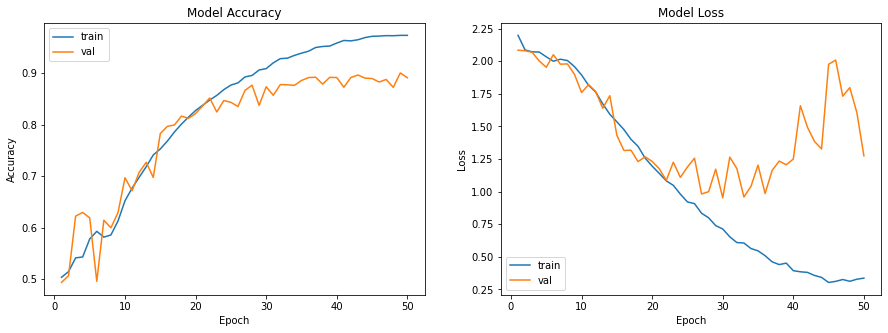

In [22]:
print('train loss:', history.history['loss'][-1])
print('train accuracy:', history.history['output_accuracy'][-1])

print('dev loss:', history.history['val_loss'][-1])
print('dev accuracy:', history.history['val_output_accuracy'][-1])

fig, axs = plt.subplots(1,2,figsize=(15,5))

axs[0].plot(range(1,len(history.history['output_accuracy'])+1), history.history['output_accuracy'])
axs[0].plot(range(1,len(history.history['val_output_accuracy'])+1),history.history['val_output_accuracy'])
axs[0].set_title('Model Accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].legend(['train', 'val'], loc='best')

axs[1].plot(range(1,len(history.history['loss'])+1),history.history['loss'])
axs[1].plot(range(1,len(history.history['val_loss'])+1),history.history['val_loss'])
axs[1].set_title('Model Loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].legend(['train', 'val'], loc='best')

plt.show()

In [23]:
predictions = model.predict(x_test)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Ide

Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:

Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_288912 in device /job:

In [24]:
print(predictions)

pred = np.array(predictions)

print(pred.shape)

[array([[2.9494658e-02, 9.7050542e-01],
       [9.9515212e-01, 4.8479028e-03],
       [3.2967368e-13, 1.0000000e+00],
       ...,
       [9.9270376e-36, 1.0000000e+00],
       [5.5689412e-01, 4.4310582e-01],
       [5.4157870e-05, 9.9994588e-01]], dtype=float32), array([[1.2705809e-05, 9.9998724e-01],
       [9.9996960e-01, 3.0351024e-05],
       [2.4943626e-35, 1.0000000e+00],
       ...,
       [0.0000000e+00, 1.0000000e+00],
       [6.6333306e-01, 3.3666694e-01],
       [2.2570861e-09, 1.0000000e+00]], dtype=float32), array([[4.1367881e-02, 9.5863211e-01],
       [9.9858296e-01, 1.4170266e-03],
       [3.1831363e-16, 1.0000000e+00],
       ...,
       [0.0000000e+00, 1.0000000e+00],
       [7.1362078e-01, 2.8637922e-01],
       [2.1019128e-05, 9.9997902e-01]], dtype=float32)]
(3, 5000, 2)


In [25]:
y_pred = []

for i in pred[2]:
    if i[0] < i[1]:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [26]:
from sklearn.metrics import confusion_matrix

confusion_mtx = confusion_matrix(y_test, y_pred)

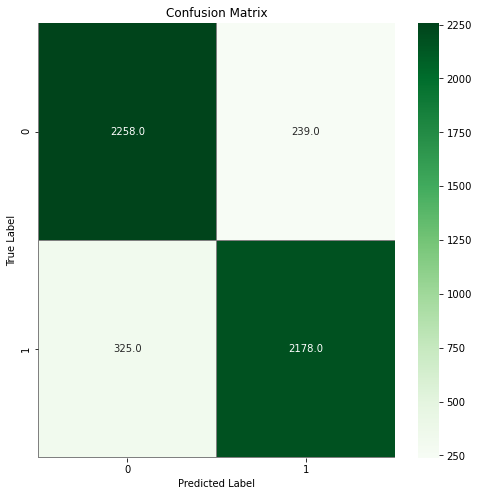

In [27]:
import seaborn as sns

f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens",linecolor="gray", fmt='.1f', ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [28]:
from sklearn.metrics import classification_report

# Generate a classification report
report = classification_report(y_test, y_pred, target_names=['cat', 'dog'])

In [29]:
print(report)

              precision    recall  f1-score   support

         cat       0.87      0.90      0.89      2497
         dog       0.90      0.87      0.89      2503

    accuracy                           0.89      5000
   macro avg       0.89      0.89      0.89      5000
weighted avg       0.89      0.89      0.89      5000



In [30]:
print('Precision:- Accuracy of positive predictions.')
print('Precision = TP/(TP + FP)')
print('Recall:- Fraction of positives that were correctly identified.')
print('Recall = TP/(TP+FN)')
print('F1 score')
print('F1 Score = 2*(Recall * Precision) / (Recall + Precision)')
print('Accuracy : (TP+TN) / all')
print('macro avg = (normal+abnormal)/2 * precision or recall or f1 score')
print('weighted avg = normal/(normal+abnormal) * precision or recall or f1 score')

Precision:- Accuracy of positive predictions.
Precision = TP/(TP + FP)
Recall:- Fraction of positives that were correctly identified.
Recall = TP/(TP+FN)
F1 score
F1 Score = 2*(Recall * Precision) / (Recall + Precision)
Accuracy : (TP+TN) / all
macro avg = (normal+abnormal)/2 * precision or recall or f1 score
weighted avg = normal/(normal+abnormal) * precision or recall or f1 score
